## 0. Libraray import

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import pyapep.isofit as isof
import pyapep.simide as simi

import matplotlib.pyplot as plt
import numpy as np

parameters = {'axes.labelsize': 17,
              'xtick.labelsize': 16,
              'ytick.labelsize': 16,
              'legend.fontsize': 13,
          'axes.titlesize': 20}
plt.rcParams.update(parameters)
plt.rcParams['font.family'] = 'arial'
from utils import *

### Process simulation

### Economic analysis

In [4]:
# Economic analysis  parameters
r = 0.08            # Interest rate (%)
t = 25              # Project lifetime (yr)
porosity = 0.2      # Column porosity (-)
att_ratio = 0.1     # Adsorbent attrition rate (%/yr)
Vacuum_pump_cost= 188094    # vacuum pump cost from reference

def Compressor_cost(P):
    if P < 3.14:
        CC = 239533
    elif P < 10:
        CC = 2*239533
    elif P <=20:
        CC = 3*239533
    return CC

def PSA_cost(PSA_config,P_high1,P_high2):
    if PSA_config == 'PSA':
        PSA_cost = 486630 + Compressor_cost(P_high1)
    elif PSA_config == 'VSA':
        PSA_cost = 486630 + Compressor_cost(P_high1)+ Vacuum_pump_cost
    elif PSA_config == 'cas':
        PSA_cost = 486630 + Compressor_cost(P_high1) +(486630+Compressor_cost(P_high2))*(0.4**0.6) # "Considering the size reduction of the second PSA unit using the six-tenth rule."

    return PSA_cost

# "Calculate the energy consumption of compressors and vacuum pumps (in kWh/yr)."
def PEnergy(PSA_config,P_high1,P_low,P_high2):
    R = 8.314                                                 # Gas const. (J/mol/K)
    if PSA_config == 'PSA' or PSA_config == 'VSA':
        # 1단 PSA 고압 일 
        T_rev_1= 298*(P_high1/1)**(2/7)
        W_rev = 10.12*(7/2)*8.314*(T_rev_1-298.15)/0.8
        
        # 1bar VSA 이하 압력 조건에 필요한 일 
        T_rev_2 = 298*(P_low/1)**(2/7)
        W_rev += -10.12*(7/2)*8.314*(T_rev_2-298.15)/0.8
        electricity = W_rev/3600000*3600*7920                # unit conversion (J/s to kWh/yr)
    elif PSA_config == 'cas':
        # 1단 PSA 고압 일
        T_rev_1= 298*(P_high1/1)**(2/7)
        W_rev = 10.12*(7/2)*8.314*(T_rev_1-298.15)/0.8
        
        # 2단 PSA 고압 일
        T_rev_2= 298*(P_high2/1)**(2/7)
        W_rev += 10.12*0.4*(7/2)*8.314*(T_rev_2-298.15)/0.8  # "Tail gas flow rate is set to 0.4 times the first-stage feed."
        electricity = W_rev/3600000*3600*7920 
    return electricity

# 경제성평가 함수
def Economic(PSA_config, target, ads_cost, density, P_high1, P_low, P_high2, recovery = None):
    # CAPEX
    equipment = 2891628 + PSA_cost(PSA_config,P_high1,P_high2) # USD
    FCI = equipment/0.428       # Fixed capital investment
    WC = FCI*0.1                # Working capital
    TCI = FCI+WC
    AF = (1-(1/(1+r)**t))/r     # Annualized factor
    EAC = TCI / AF              # Annualized capital cost

    # OPEX
    FC = FCI*0.035                  # Fixed charge
    RM = 27 * 25344                 # Raw material (Grass silage, 12USD/ton)
    Steam = 12 *  1543.44           # Steam (12USD/ton)

    single_column_volume = (0.45/2)**2*3.14*2.25*(816/500)*3    #  "Volume of a single PSA column (reference)."

    if PSA_config == 'cas':
        PSA_vol = single_column_volume*2*1.4        # column volume (m3)(the packing capacity is 1.4 times higher in cascade PSA)
    else:
        PSA_vol = single_column_volume*2            # column volume (m3)
    
    ads_repl = 2                    # Adsorbent replacement (year)
    Ads_cost = ads_cost*density * PSA_vol / ads_repl # Adsorbent cost (USD/yr)

    Elect = 0.075 * (1160250 + PEnergy(PSA_config,P_high1,P_low,P_high2)) # Electricity
    M = FCI*0.02                        # Maintenance
    OL = 3*30000                        # Operating labor (3 person)
    S = OL * 0.15                       # Supervision and support labor
    OS = M * 0.1                        # Operating supplies
    OVHD = (M + OL + S) * 0.2           # Plant overhead cost

    VPC = RM + Steam + Ads_cost + Elect + M + OL + S + OS   # Variable production cost
    TMC = FC+VPC+OVHD                                       # Total manufacturing cost
    GE = OL * 0.15                                          # General expenses
    TPC = TMC + GE                                          # Total production cost

    TAC = EAC + TPC
    if recovery == None:
        if PSA_config == 'PSA':
            recovery = target[f'Re_CH4_PSA_{P_high1}']
        elif PSA_config == 'VSA':
            recovery = target[f'Re_CH4_VSA_{P_low}']
        elif PSA_config == 'cas':
            recovery = target[f'Re_CH4_cas_{P_high1}_{P_high2}']
            
    CH4_prod = recovery * 1706697      # Annual CH4 production (F_f,CH4 = 1706697 kg/yr)
    LC = TAC/CH4_prod            # Levelized cost ($/kg H4)
    return int(EAC), int(TPC), LC

### Data reading

In [5]:
data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_10808\40912218.py:1: DtypeWarning: Columns (25,26,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')


## Base condition screening

### PSA (P_high,1 = 8 bar, P_low  = 1 bar)

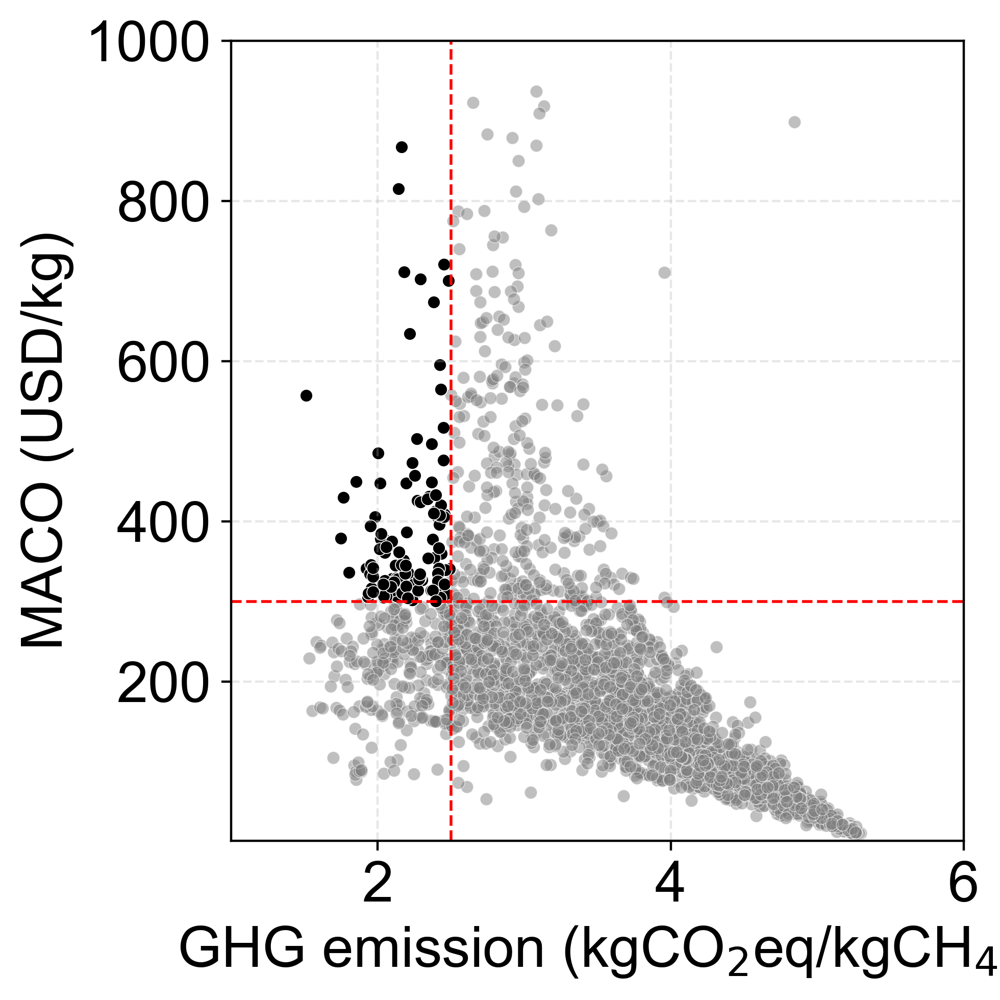

In [15]:
# Process variables
PSA_config = 'PSA'
P_low = 1
P_high1 = 8
P_high2 = 8

# Settings for adsorbent screening
# Recovery value when GHG emissions meet 2.5 kgCO2eq/CH4
reco = 0.9615
adsC = 300

# Adsorbent screening
plot_data1_PSA = data_clean[data_clean[f'Max_adsC_{PSA_config}_{P_high1}'] < 10**10]  # Remove cases where MACO is not derived
plot_data2_PSA = plot_data1_PSA[
    (plot_data1_PSA[f'Re_CH4_{PSA_config}_{P_high1}'] > reco) & 
    (plot_data1_PSA[f'Max_adsC_{PSA_config}_{P_high1}'] > adsC)
]  # Conditions for selected adsorbents

# GHG conversion
Elec = PEnergy(PSA_config, P_high1, P_low, P_high2)  # Power consumption in kWh/year

GHG_1_PSA = (529 + (1 - plot_data1_PSA[f'Re_CH4_{PSA_config}_{P_high1}']) * 390 * 28) / 390 * plot_data1_PSA[f'Re_CH4_{PSA_config}_{P_high1}'] + (Elec * 370 / 1000) / (1706697 * plot_data1_PSA[f'Re_CH4_{PSA_config}_{P_high1}'])
GHG_2_PSA = (529 + (1 - plot_data2_PSA[f'Re_CH4_{PSA_config}_{P_high1}']) * 390 * 28) / 390 * plot_data2_PSA[f'Re_CH4_{PSA_config}_{P_high1}'] + (Elec * 370 / 1000) / (1706697 * plot_data2_PSA[f'Re_CH4_{PSA_config}_{P_high1}'])
GHG_stan = (529 + (1 - reco) * 390 * 28) / 390 * reco + (Elec * 370 / 1000) / (1706697 * reco)  # Display GHG standard

# Plotting results
plt.figure(dpi=400, figsize=(5, 5))
plt.scatter(GHG_1_PSA, plot_data1_PSA[f'Max_adsC_{PSA_config}_{P_high1}'], c='gray', alpha=0.5, 
            s=20, edgecolors='white', linewidths=0.3)  # Display all adsorbents
plt.scatter(GHG_2_PSA, plot_data2_PSA[f'Max_adsC_{PSA_config}_{P_high1}'], c='k', alpha=1, 
            s=20, edgecolors='white', linewidths=0.3, label=f'Selected \nadsorbents ({PSA_config})')  # Display selected adsorbents
plt.axhline(y=adsC, color='r', linestyle='--', linewidth=1)  # Horizontal reference line for adsC
plt.axvline(x=GHG_stan, color='r', linestyle='--', linewidth=1)  # Vertical reference line for GHG standard

plt.ylabel('MACO (USD/kg)')
plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
plt.ylim([1, 1000])
plt.xlim([1, 6])

plt.tight_layout()
plt.grid(alpha=0.3, linestyle='--')
plt.show()
# plt.savefig(f'{PSA_config}_{P_high1}_screening.png', transparent=True)


### VSA (P_high,1 = 8 bar, P_low  = 0.1 bar)

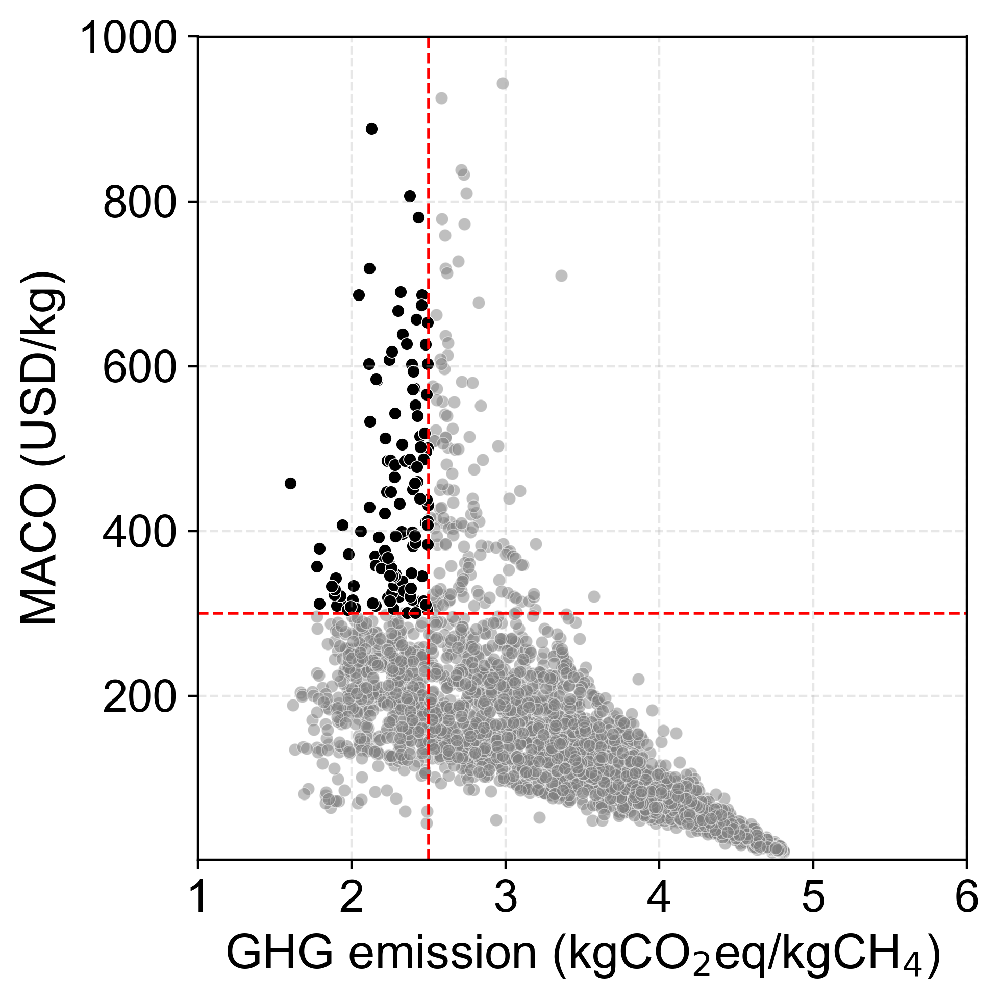

In [6]:
# Process variables
PSA_config = 'VSA'
P_low = 0.1
P_high1 = 8
P_high2 = 8

# Settings for adsorbent screening
# Recovery value when GHG emissions meet 2.5 kgCO2eq/CH4
reco = 0.9653
adsC = 300

# Calculate energy consumption (kWh/year)
Elec = PEnergy(PSA_config, P_high1, P_low, P_high2)

# Adsorbent screening
plot_data1_VSA = data_clean[data_clean[f'Max_adsC_{PSA_config}_{P_low}'] < 10**10]  # Remove adsorbents that failed to meet criteria (maximum adsorbent cost not derived)
plot_data2_VSA = plot_data1_VSA[
    (plot_data1_VSA[f'Re_CH4_{PSA_config}_{P_low}'] > reco) & 
    (plot_data1_VSA[f'Max_adsC_{PSA_config}_{P_low}'] > adsC)
]  # Conditions for selected adsorbents

# GHG conversion
GHG_1_VSA = (529 + (1 - plot_data1_VSA[f'Re_CH4_{PSA_config}_{P_low}']) * 390 * 28) / 390 * plot_data1_VSA[f'Re_CH4_{PSA_config}_{P_low}'] + (Elec * 370 / 1000) / (1706697 * plot_data1_VSA[f'Re_CH4_{PSA_config}_{P_low}'])
GHG_2_VSA = (529 + (1 - plot_data2_VSA[f'Re_CH4_{PSA_config}_{P_low}']) * 390 * 28) / 390 * plot_data2_VSA[f'Re_CH4_{PSA_config}_{P_low}'] + (Elec * 370 / 1000) / (1706697 * plot_data2_VSA[f'Re_CH4_{PSA_config}_{P_low}'])
GHG_stan = (529 + (1 - reco) * 390 * 28) / 390 * reco + (Elec * 370 / 1000) / (1706697 * reco)  # GHG standard reference line

# Plotting results
plt.figure(dpi=400, figsize=(5, 5))
plt.scatter(GHG_1_VSA, plot_data1_VSA[f'Max_adsC_{PSA_config}_{P_low}'], c='gray', alpha=0.5, 
            s=20, edgecolors='white', linewidths=0.3)  # Display all adsorbents
plt.scatter(GHG_2_VSA, plot_data2_VSA[f'Max_adsC_{PSA_config}_{P_low}'], c='k', alpha=1, 
            s=20, edgecolors='white', linewidths=0.3, label=f'Selected\nadsorbents ({PSA_config})')  # Display selected adsorbents
plt.axhline(y=adsC, color='r', linestyle='--', linewidth=1)  # Horizontal reference line for adsC
plt.axvline(x=GHG_stan, color='r', linestyle='--', linewidth=1)  # Vertical reference line for GHG standard

plt.ylabel('MACO (USD/kg)')
plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
plt.ylim([1, 1000])
plt.xlim([1, 6])

plt.tight_layout()
plt.grid(alpha=0.3, linestyle='--')
plt.show()
# plt.savefig(f'{PSA_config}_{P_high1}_{P_low}_screening.png', transparent=True)


### Cascade PSA (P_high,1, P_high,2 = 8 bar, P_low = 1 bar)

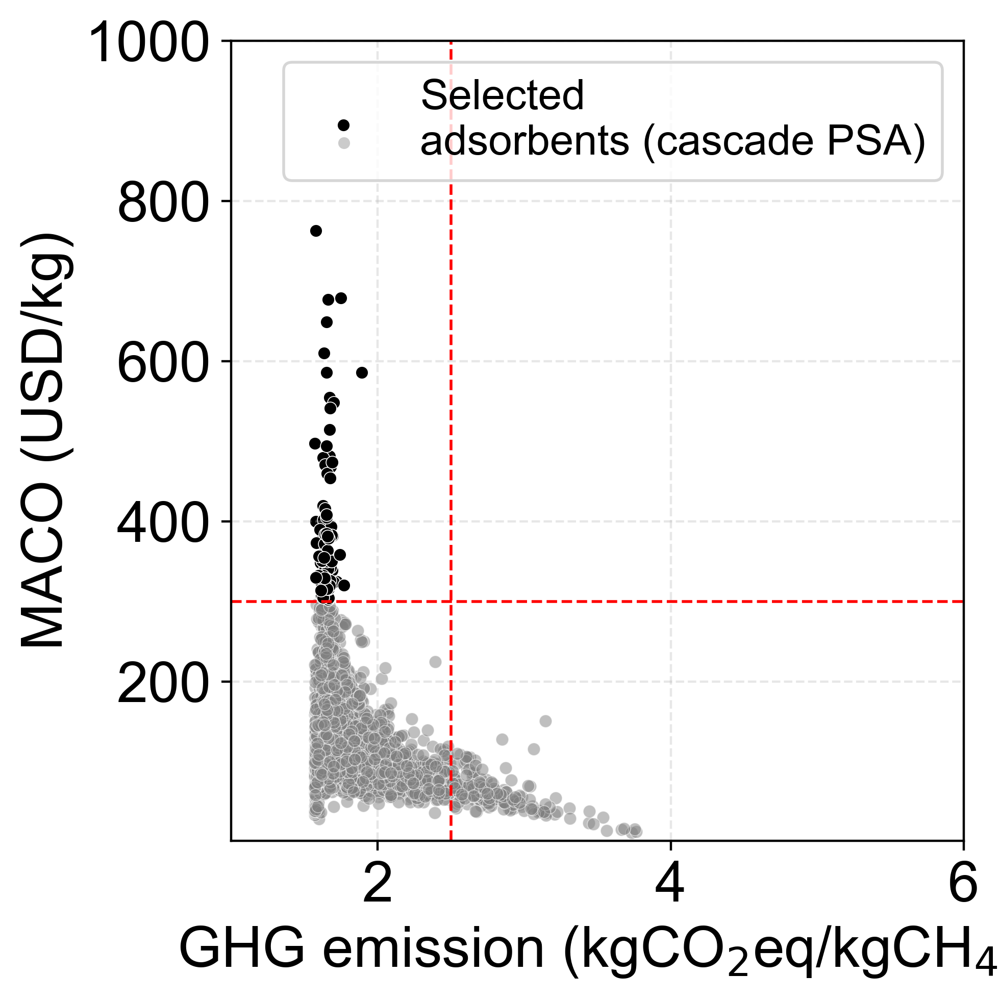

In [17]:
# Process variables
PSA_config = 'cas'
P_low = 1
P_high1 = 8
P_high2 = 8

# Settings for adsorbent screening
# Recovery value when GHG emissions meet 2.5 kgCO2eq/CH4
reco = 0.9640
adsC = 300

# Calculate energy consumption (kWh/year)
Elec = PEnergy(PSA_config, P_high1, P_low, P_high2)

# Adsorbent screening
plot_data1_cas = data_clean[
    (data_clean[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'] < 10**10) & 
    (data_clean[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] < 1)
]  # Remove cases where maximum adsorbent cost is not derived
plot_data2_cas = plot_data1_cas[
    (plot_data1_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] > reco) & 
    (plot_data1_cas[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'] > adsC)
]  # Conditions for selected adsorbents

# GHG conversion
GHG_1_cas = (529 + (1 - plot_data1_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']) * 390 * 28) / 390 * plot_data1_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] + (Elec * 370 / 1000) / (1706697 * plot_data1_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'])
GHG_2_cas = (529 + (1 - plot_data2_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']) * 390 * 28) / 390 * plot_data2_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] + (Elec * 370 / 1000) / (1706697 * plot_data2_cas[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'])
GHG_stan = (529 + (1 - reco) * 390 * 28) / 390 * reco + (Elec * 370 / 1000) / (1706697 * reco)  # Display GHG standard reference line

# Plotting results
plt.figure(dpi=400, figsize=(5, 5))
plt.scatter(GHG_1_cas, plot_data1_cas[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'], c='gray', alpha=0.5, 
            s=20, edgecolors='white', linewidths=0.3)  # Display all adsorbents
plt.scatter(GHG_2_cas, plot_data2_cas[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'], c='k', alpha=1,
            s=20, edgecolors='white', linewidths=0.3, label=f'Selected\nadsorbents (cascade PSA)')  # Display selected adsorbents
plt.axhline(y=adsC, color='r', linestyle='--', linewidth=1)  # Horizontal reference line for adsC
plt.axvline(x=GHG_stan, color='r', linestyle='--', linewidth=1)  # Vertical reference line for GHG standard

plt.ylabel('MACO (USD/kg)')
plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
plt.ylim([1, 1000])
plt.xlim([1, 6])
plt.legend()

plt.tight_layout()
plt.grid(alpha=0.3, linestyle='--')
plt.show()
# plt.savefig(f'{PSA_config}_{P_high1}_{P_high2}_screening.png', transparent=True)


### 3 in 1

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\2040790337.py:24: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG_1_PSA, plot_data1_PSA[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[1], alpha=0.5, s=20, edgecolors='white', linewidths=0.3) # 모든 흡착제
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\2040790337.py:25: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG_2_PSA, plo

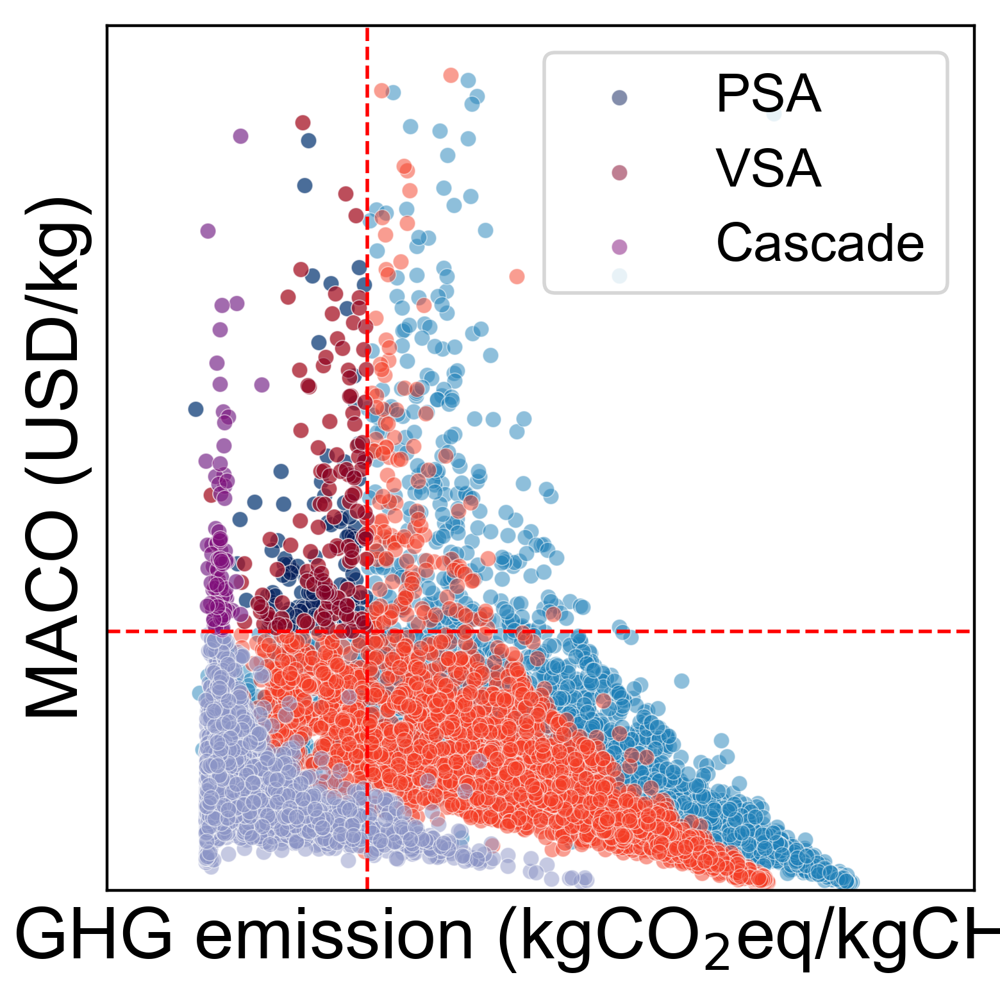

In [18]:

parameters = {'axes.labelsize': 20,
              'xtick.labelsize': 20,
              'ytick.labelsize': 20,
              'legend.fontsize': 15,
          'axes.titlesize': 20}
plt.rcParams.update(parameters)
plt.rcParams['font.family'] = 'arial'

plt.figure(dpi=400, figsize=(4,4))

# PSA  
PSA_config = 'PSA'
P_low =1
P_high1=8
P_high2=8


# color
cmap_case = plt.get_cmap('YlGnBu')
num_colors = 7
colors = cmap_case(np.linspace(0, 1, num_colors))[3:]

# plot 
plt.scatter(GHG_1_PSA, plot_data1_PSA[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[1], alpha=0.5, s=20, edgecolors='white', linewidths=0.3) # all adsorbents
plt.scatter(GHG_2_PSA, plot_data2_PSA[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[3], alpha=0.5, s=20, edgecolors='white', linewidths=0.3,label=PSA_config) # # selected adsorbents

# VSA 
PSA_config = 'VSA'
P_low =0.1
P_high1 = 8

# color
cmap_case = plt.get_cmap('YlOrRd')
num_colors = 4
colors = cmap_case(np.linspace(0, 1, num_colors))

# plot 
plt.scatter(GHG_1_VSA, plot_data1_VSA[f'Max_adsC_{PSA_config}_{P_low}'], c=colors[2], alpha=0.5, s=20, edgecolors='white', linewidths=0.3)
plt.scatter(GHG_2_VSA, plot_data2_VSA[f'Max_adsC_{PSA_config}_{P_low}'], c=colors[3], alpha=0.5, s=20, edgecolors='white', linewidths=0.3,label=PSA_config)

# cascade 
PSA_config = 'cas'
P_low =1
P_high1 = 8
P_high2 = 8


# color
cmap_case = plt.get_cmap('BuPu')
num_colors = 9
colors = cmap_case(np.linspace(0, 1, num_colors))[2:]

# plot 
plt.scatter(GHG_1_cas, plot_data1_cas[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'], c=colors[2], alpha=0.5, s=20, edgecolors='white', linewidths=0.3) # all adsorbents
plt.scatter(GHG_2_cas, plot_data2_cas[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'], c=colors[5], alpha=0.5, s=20, edgecolors='white', linewidths=0.3,label='Cascade')  # selected adsorbents
plt.axhline(y=adsC, color='r', linestyle='--', linewidth=1)
plt.axvline(x=GHG_stan, color='r', linestyle='--', linewidth=1)

# plt.title(' PSA, VSA, cascade result')
plt.ylabel('MACO (USD/kg)')
plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
plt.ylim([1,1000])
plt.xlim([1,6])
plt.legend()
# plt.text(GHG_stan*0.5,950,f' {len(plot_data2)} adsorbents')
plt.grid(alpha=0.3, linestyle = '--')
plt.yticks([], [])
plt.xticks([], [])
plt.tight_layout()
plt.show()


## Sensitivity analysis

### PSA

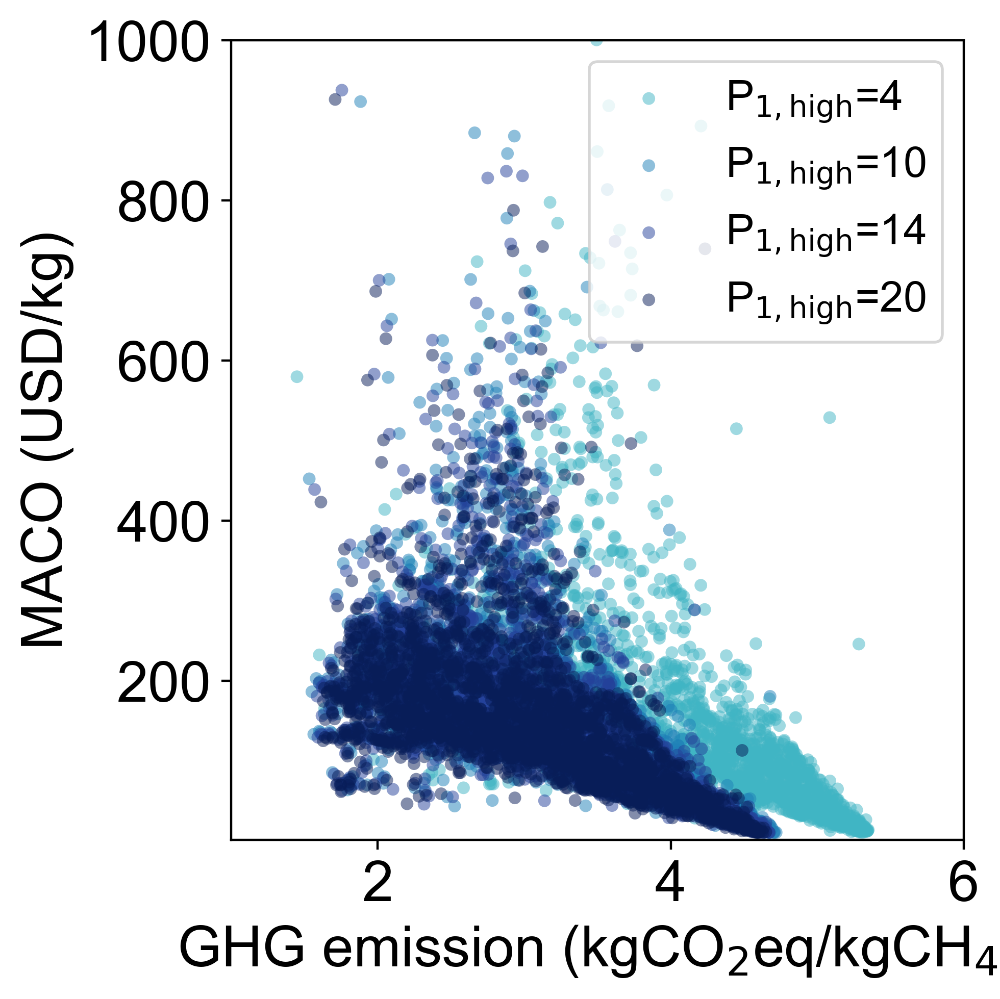

In [19]:
PSA_config = 'PSA'
P_low =1
P_high2=8

cmap_case = plt.get_cmap('YlGnBu')
num_colors = 10
colors = cmap_case(np.linspace(0, 1, num_colors))
    
plt.figure(dpi=400, figsize=(5,5))

P_dom = [4,6,8,10,12,14,16,18,20]
P_dom = [4, 10, 14, 20]

for i, P_high1 in enumerate(P_dom):
    colors = cmap_case(np.linspace(0, 1, len(P_dom)+3))[3:]
    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_high1}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_high1}']<1)] 
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2)
    GHG_1=(529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}'])
    
    #plot
    graph=plt.scatter(GHG_1, plot_data[f'Max_adsC_{PSA_config}_{P_high1}'], color=colors[i], 
                      alpha=0.5, s=20,
                      edgecolors='none',
                      label=f'P$_\mathrm{{{{1,high}}}}$={P_high1}') #, #ads={len(plot_data)}

    #label
    # plt.title(f'{PSA_config} (P$_\mathrm{{{{1,high}}}}$: 4\u201320 bar)')
    plt.ylabel('MACO (USD/kg)')
    plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
    plt.ylim([1,1000])
    plt.xlim([1,6])
    plt.tight_layout()
    plt.legend()
plt.show()
# plt.savefig(f'{PSA_config}_4-20_sensitivity.png',transparent=True)


### VSA

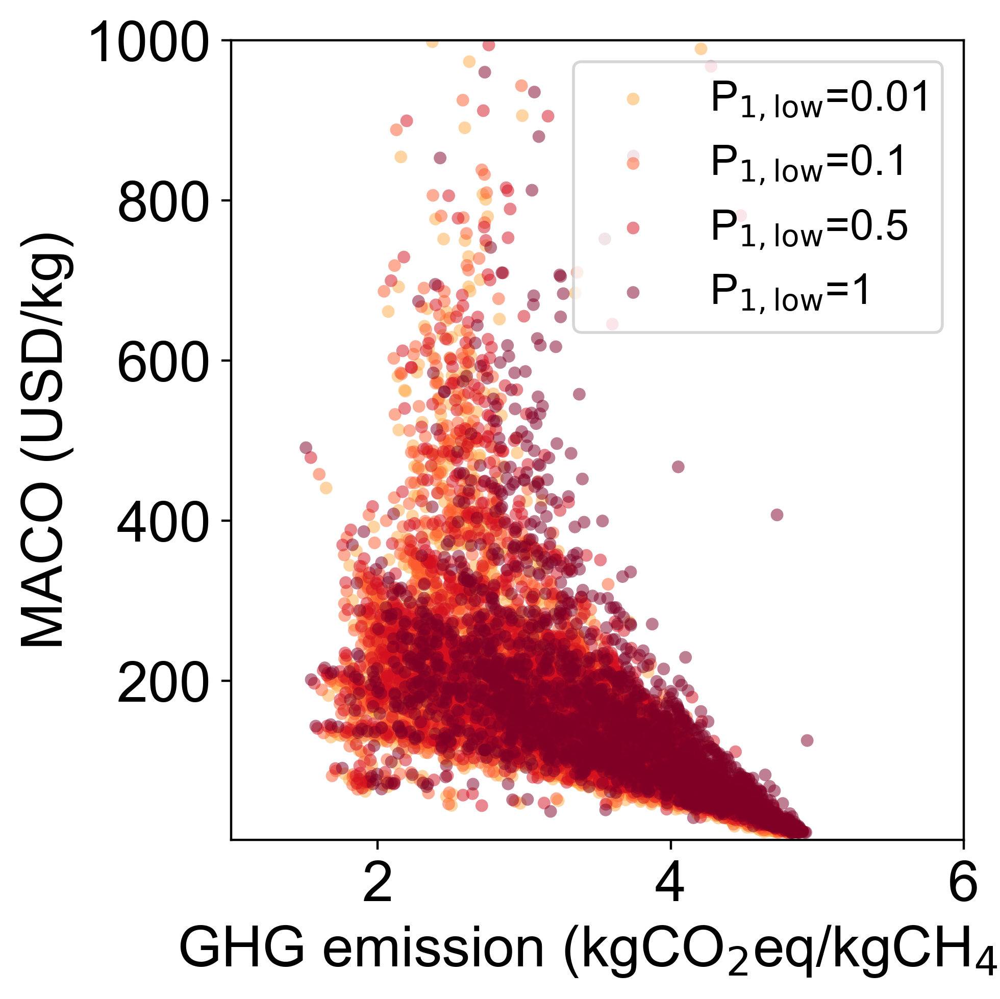

In [20]:
PSA_config = 'VSA'
P_high1 =8
P_high2 =8

cmap_case = plt.get_cmap('YlOrRd')
plt.figure(dpi=400, figsize=(5,5))
P_dom = [0.01,0.04,0.07,0.1,0.3,0.5,0.7,0.9,1]
P_dom = [0.01,0.1,0.5,1]
for i, P_low in enumerate(P_dom):
    
    colors = cmap_case(np.linspace(0.4, 1, len(P_dom)))
    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_low}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_low}']<1)]
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2) #kWh/yr 
    GHG_1=(529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_low}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_low}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_low}'])
    
    #plot
    graph=plt.scatter(GHG_1, plot_data[f'Max_adsC_{PSA_config}_{P_low}'], color=colors[i], alpha=0.5, 
                      edgecolors='none',
                      s=20,label=f'P$_\mathrm{{{{1,low}}}}$={P_low}') #, #ads={len(plot_data)}

    #label
    # plt.title(f'{PSA_config} (P$_\mathrm{{{{1,low}}}}$: 0.01\u20131 bar)')
    plt.ylabel('MACO (USD/kg)')
    plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
    plt.ylim([1,1000])
    plt.xlim([1,6])
    plt.tight_layout()
    plt.legend()
plt.show()


### Cascade PSA

#### Simulataneous

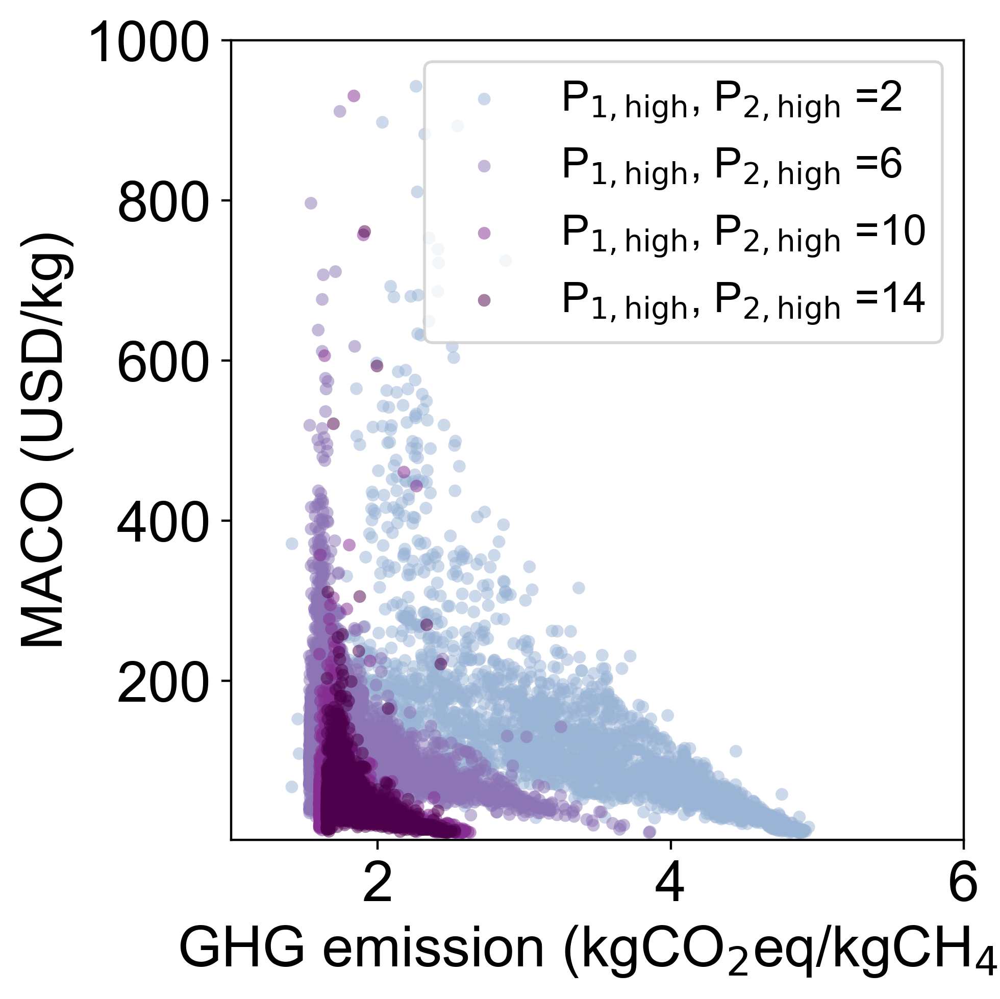

In [21]:
PSA_config = 'cas'
P_low=1

cmap_case = plt.get_cmap('BuPu')
P_dom = [[2,2],[4,4],[6,6],[8,8],[10,10],[12,12],[14,14]]
  
plt.figure(dpi=400, figsize=(5,5))


P_dom = [[2,2],[6,6],[10,10],[14,14]]
for i, [P_high1,P_high2] in enumerate(P_dom):

    colors = cmap_case(np.linspace(0, 1, len(P_dom)+2))[2:]

    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']<1)]
    
    # GHG conversion
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2)
    GHG_1=(529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'])
    
    #plot
    graph=plt.scatter(GHG_1, plot_data[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'], color=colors[i], alpha=0.5, s=20,
                      edgecolors='none',
                      label=f'P$_\mathrm{{{{1,high}}}}$, P$_\mathrm{{{{2,high}}}}$ ={P_high1}') #, #ads={len(plot_data)}

    #label
    # plt.title('Cascade (P$\mathrm{_{1,high}}$, P$\mathrm{_{2,high}}$: 2\u201314 bar)')
    plt.ylabel('MACO (USD/kg)')
    plt.xlabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
    plt.ylim([1,1000])
    plt.xlim([1,6])
    plt.tight_layout()
    plt.legend()
plt.show()



### Average variation

c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\IPython\core\interactiveshell.py:3508: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\IPython\core\interactiveshell.py:3508: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\IPython\core\interactiveshell.py:3508: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\IPython\core\interactiveshell.py:3508: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


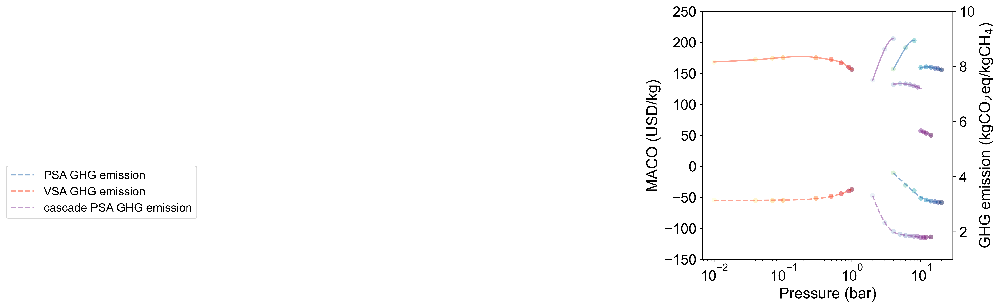

<Figure size 2000x2000 with 0 Axes>

In [7]:
fig, ax1 = plt.subplots(dpi=400, figsize=(5, 5))

ax2 = ax1.twinx()

PSA_config = 'PSA'
P_low =1
P_high2=6

    
plt.figure(dpi=400, figsize=(5,5))
ax1.set_xscale('log')

cmap_case = plt.get_cmap('YlGnBu')
num_colors = 10
colors = cmap_case(np.linspace(0, 1, num_colors))

P_dom = [4,6,8,10,12,14,16,18,20]

GHG_PSA=[]
MACO_PSA=[]
for i, P_high1 in enumerate(P_dom):
    colors = cmap_case(np.linspace(0, 1, len(P_dom)+3))[3:]
    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_high1}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_high1}']<1)] 
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2)
    GHG_1=np.average((529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']))
    MACO=np.average(plot_data[f'Max_adsC_{PSA_config}_{P_high1}'])
    #plot
    ax1.scatter(P_dom[i], MACO, color=colors[i], alpha=0.5, s=30, edgecolors='none')
    ax2.scatter(P_dom[i], GHG_1, color=colors[i], alpha=0.5, s=30, edgecolors='none')
    GHG_PSA.append(GHG_1)
    MACO_PSA.append(MACO)

# MACO  range 1    
P_dom1=np.linspace(4,8,30)
coeff1 = np.polyfit(P_dom[:3],MACO_PSA[:3], 3)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5)

# MACO  range 2
P_dom1=np.linspace(10,20,30)
coeff1 = np.polyfit(P_dom[4:],MACO_PSA[4:], 8)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5,label='PSA MACO')

# GHG
P_dom1=np.linspace(4,20,40)
coeff1 = np.polyfit(P_dom,GHG_PSA, 3)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax2.plot(P_dom1,MACO1_dom,color=colors[i-3],linestyle='--',alpha=0.5,label='PSA GHG emission')





PSA_config = 'VSA'
P_high1 =6
P_high2 =6

cmap_case = plt.get_cmap('YlOrRd')
P_dom = [0.01,0.04,0.07,0.1,0.3,0.5,0.7,0.9,1]

GHG_VSA=[]
MACO_VSA=[]
for i, P_low in enumerate(P_dom):
    
    colors = cmap_case(np.linspace(0, 1, len(P_dom)))
    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_low}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_low}']<1)]
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2) #kWh/yr 
    GHG_1=np.average((529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_low}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_low}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_low}']))
    MACO=np.average(plot_data[f'Max_adsC_{PSA_config}_{P_low}'])
    #plot
    ax1.scatter(P_dom[i], MACO, color=colors[i], alpha=0.5,                       edgecolors='none',s=30) #, #ads={len(plot_data)}
    ax2.scatter(P_dom[i], GHG_1, color=colors[i], alpha=0.5, 
                      edgecolors='none',s=30) #, #ads={len(plot_data)}
    GHG_VSA.append(GHG_1)
    MACO_VSA.append(MACO)


# MACO
P_dom1=np.linspace(0.01,1,30)
coeff1 = np.polyfit(P_dom,MACO_VSA, 5)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5,label='VSA MACO')

# GHG
P_dom1=np.linspace(0.01,1,30)
coeff1 = np.polyfit(P_dom,GHG_VSA, 3)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax2.plot(P_dom1,MACO1_dom,color=colors[i-3],linestyle='--',alpha=0.5,label='VSA GHG emission')



PSA_config = 'cas'
P_low=1

cmap_case = plt.get_cmap('BuPu')
P_dom = [[2,2],[3,3],[4,4],[5,5],[6,6],[7,7],[8,8],[9,9],[10,10],[11,11],[12,12],[14,14]]

GHG_cas=[]
MACO_cas=[]
for i, [P_high1,P_high2] in enumerate(P_dom):

    colors = cmap_case(np.linspace(0, 1, len(P_dom)+2))[2:]

    # Remove adsorbents where MACO is not derived or recovery exceeds 1 under each pressure condition
    plot_data = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}']<10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']<1)]
    
    # GHG conversion
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2)
    GHG_1=np.average((529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']+(Elec*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}']))
    MACO=np.average(plot_data[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'])
    #plot
    ax1.scatter(P_high1, MACO, color=colors[i], alpha=0.5, s=30,edgecolors='none') #, #ads={len(plot_data)}
    ax2.scatter(P_high1, GHG_1, color=colors[i], alpha=0.5, s=30,edgecolors='none') #, #ads={len(plot_data)}
    GHG_cas.append(GHG_1)
    MACO_cas.append(MACO)
        
# MACO  range 1    
P_dom = [2,3,4,5,6,7,8,9,10,11,12,14]
P_dom1=np.linspace(2,4,30)
a=MACO_cas[:2]
a.append((MACO_cas[1]-MACO_cas[0])/3+MACO_cas[1])
coeff1 = np.polyfit(P_dom[:3],a, 2)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.scatter(4, a[2], color=colors[2], alpha=0.5, s=30,edgecolors='none')
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5)

# MACO  range 2    
P_dom1=np.linspace(4,10,10)
coeff1 = np.polyfit(P_dom[3:7],MACO_cas[3:7], 8)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5)

# MACO  range 3    
P_dom1=np.linspace(10,14,10)
coeff1 = np.polyfit(P_dom[8:11],MACO_cas[8:11], 3)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax1.plot(P_dom1,MACO1_dom,color=colors[i-3],alpha=0.5,label='cascade PSA MACO')

# GHG
P_dom1=np.linspace(2,14,50)
coeff1 = np.polyfit(P_dom,GHG_cas, 6)
poly1 = np.poly1d(coeff1)
MACO1_dom = poly1(P_dom1)
ax2.plot(P_dom1,MACO1_dom,color=colors[i-3],linestyle='--',alpha=0.5,label='cascade PSA GHG emission')    


ax1.set_ylim(-150,250)
ax2.set_ylim(1,10)

# ax1.legend()
ax2.legend(bbox_to_anchor=(-2, 0.4))
# ax1.set_title('Average variation')
ax1.set_ylabel('MACO (USD/kg)')
ax1.set_xlabel('Pressure (bar)')
ax2.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')
plt.tight_layout()


## Optimization

### PSA

In [23]:
data_poly=plot_data2_PSA

##### Differential evolution

In [ ]:
from scipy.optimize import differential_evolution
from scipy.optimize import minimize
from scipy.interpolate import UnivariateSpline

P_feed = 6         # Feed pressure (bar)
T_feed = 323.15    # Feed temperature (K)
y_feed = [0.33, 0.67]  # Feed mole fraction (mol/mol) (CO2 / CH4)
P_high1 = 6        # P_high1: Operating pressure for PSA and VSA, or first column pressure for 'cas'
P_high2 = 6        # P_high2: Second column pressure for 'cas'
P_low = 1          # Low pressure (bar) ==> If set below 1 bar, VPSA simulation becomes possible
PSA_config = 'PSA'
LC_threshold = 1.75

# Objective function to optimize MACO based on P_high1
def objective_function(P_high1):
    try:
        # Load individual data (from the imported CSV file)
        target_mof = data_poly.iloc[j, :]

        # Derive isotherms for the two gases
        mix_iso = WhichIsoFunction(target_mof)

        # Derive mixture isotherm function using IAST
        iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)

        # Perform ideal PSA process simulation
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, y_feed)
        globals()[f'CI_{j}'].opercond(P_high1, P_low)

        # Derive tail gas composition
        x_ext = globals()[f'CI_{j}'].runideal()

    except:
        x_ext = np.array([-2023, -2023])
    CH4 = x_ext[1]
    recovery = 1 - (CH4 * (y_feed[1] - 1)) / (y_feed[1] * (CH4 - 1))
    C_dom = np.array([10**adsC for adsC in np.linspace(1, 6, 600)])
    LC_dom = [Economic(PSA_config, target_mof, adsC, target_mof['Density'], P_high1, P_low, P_high2, recovery=recovery)[-1] - LC_threshold for adsC in C_dom]
    fq = UnivariateSpline(C_dom, LC_dom)
    MACO = fq.roots()[0]

    return -MACO

# For all data
opt_data_PSA = pd.DataFrame()
grid_data_PSA = pd.DataFrame()
P_high1_list = []
MAX_MACO_list = []
MOF_name = []

for j in range(len(data_poly)):
    print(f'###########{j}/{len(data_poly)}')
    Pressure_range = np.linspace(4, 20, 20)

    MACO_list = []
    for P_high1 in Pressure_range:
        MACO = objective_function(P_high1)
        MACO_list.append(MACO)
    grid_data_PSA[f'{data_poly.iloc[j, :][2]}_Pressure'] = Pressure_range
    grid_data_PSA[f'{data_poly.iloc[j, :][2]}_MACO'] = MACO_list

    # Set the range of pressures
    bounds = [(min(Pressure_range), max(Pressure_range))]  # Define the minimum and maximum pressure values

    # Perform optimization
    result = differential_evolution(objective_function, bounds, polish=False)
    optimal_pressure_point = result.x[0]
    optimal_MACO = result.fun
    print(f"{data_poly.iloc[j, :][2]}")
    print("Optimized P_high1", result.x[0])
    print("Maximum MACO:", -result.fun)
    P_high1_list.append(optimal_pressure_point)
    MAX_MACO_list.append(optimal_MACO)
    MOF_name.append(data_poly.iloc[j, :][2])

# Save results to DataFrame
opt_data_PSA['MOF_name'] = MOF_name
opt_data_PSA['P_high1'] = P_high1_list
opt_data_PSA['opt_MACO_Diffev'] = MAX_MACO_list

# Export results to CSV
opt_data_PSA.to_csv("PSA_opt_Diffev.csv")
grid_data_PSA.to_csv("PSA_grid.csv")


#### opt result PSA

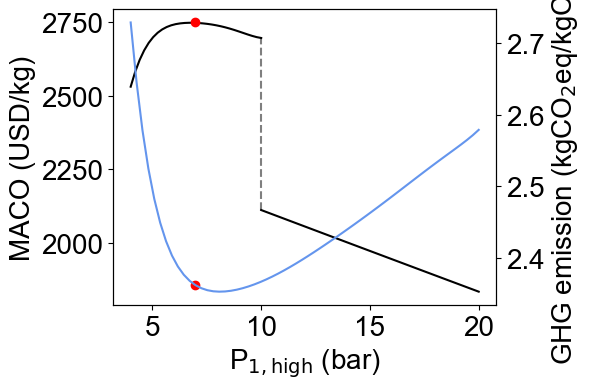

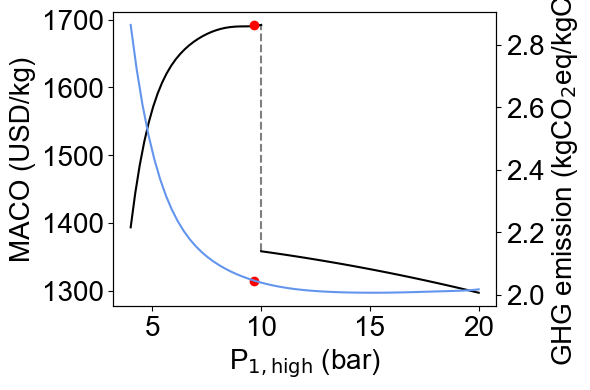

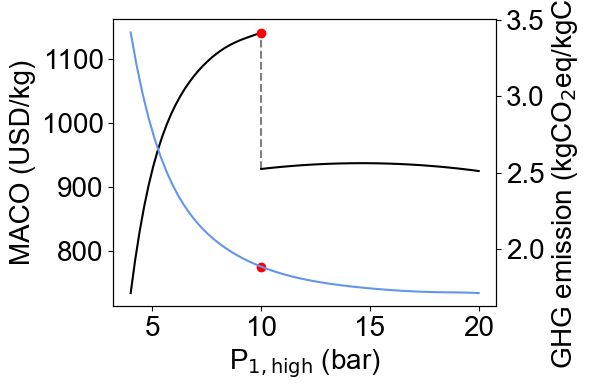

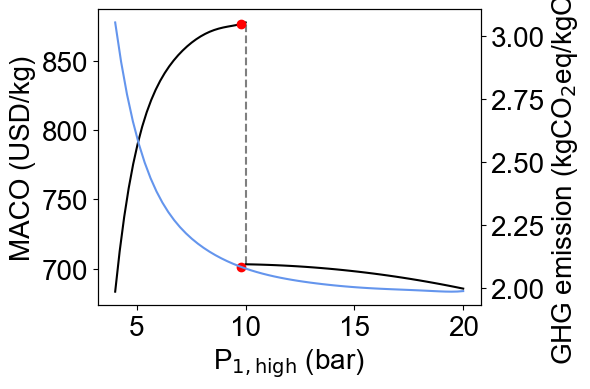

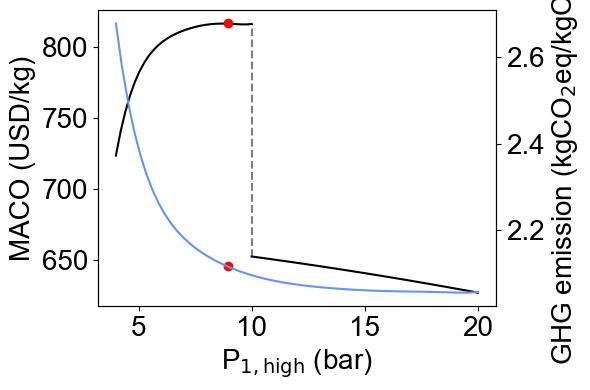

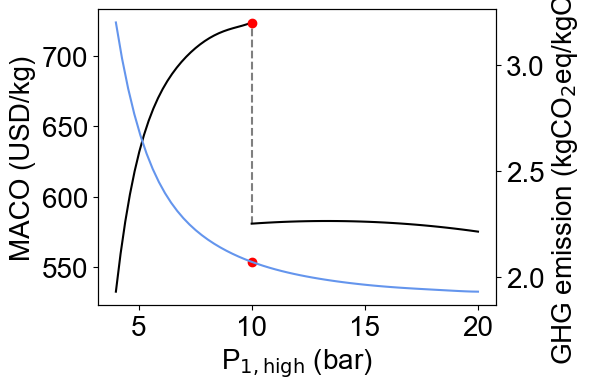

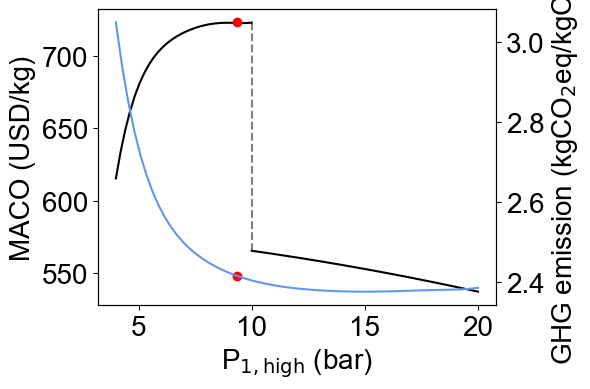

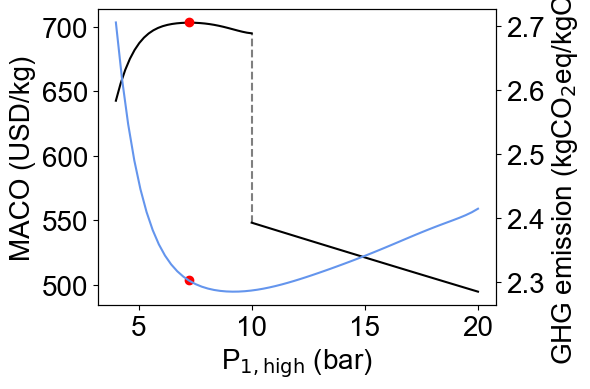

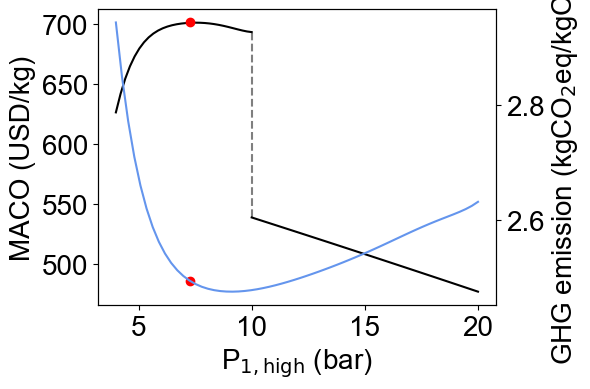

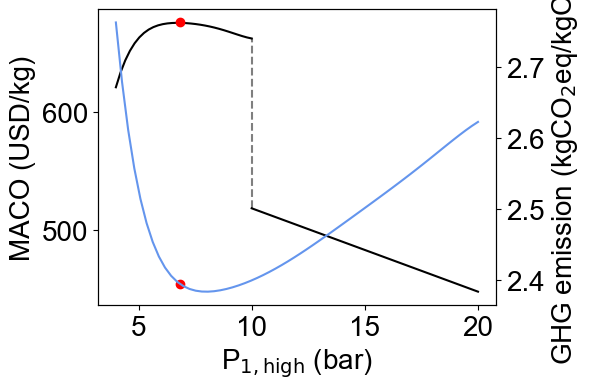

In [25]:
PSA_config='PSA'

opt_data_PSA_0=pd.read_csv('PSA_opt_Diffev.csv')
opt_data_PSA=opt_data_PSA_0.sort_values('opt_MACO_Diffev')
grid_data_PSA=pd.read_csv('PSA_grid.csv')
data_poly2=pd.merge(opt_data_PSA, data_poly, left_on='MOF_name', right_on='Directory')

Pressure_range = np.linspace(4,20,20)

# Define pressure domains for fitting and plotting
P1_dom = np.linspace(4,10,30)
P2_dom = np.linspace(10,20,30)
P3_dom = np.linspace(4,20,60)

for j in range(10):
    fig, ax1 = plt.subplots(dpi=100, figsize=(6,4))
    ax2 = ax1.twinx()    
    
    # MACO calculation
    yy = -grid_data_PSA[f'{data_poly2.iloc[j, :][1]}_MACO']
    coeff1 = np.polyfit(Pressure_range[:8], yy[:8], 5)
    poly1 = np.poly1d(coeff1)
    MACO1_dom = poly1(P1_dom)
    
    coeff2 = np.polyfit(Pressure_range[8:], yy[8:], 2)
    poly2 = np.poly1d(coeff2)
    MACO2_dom = poly2(P2_dom)
    
    optimal_pressure_point=float(opt_data_PSA.iloc[j, :]['P_high1'])
    optimal_MACO= -opt_data_PSA.iloc[j, :]['opt_MACO_Diffev']
    
    
    # MACO plot
    ax1.plot(P1_dom, MACO1_dom, c='k',label='MACO')
    ax1.plot(P2_dom, MACO2_dom, c='k')
    ax1.vlines(10, ymax=MACO1_dom[-1], ymin=MACO2_dom[0], linestyles='--', color='k', alpha=0.5)
    ax1.set_ylabel('MACO (USD/kg)')
    ax1.scatter(optimal_pressure_point,optimal_MACO, c= 'r', zorder = 2)

    
    # GHG 계산
    P_high1_range=[4,6,8,10,12,14,16,18,20]

    reco_array=np.array([data_poly2.iloc[j,:][f'Re_CH4_{PSA_config}_{P_high1}'] for P_high1 in P_high1_range])
    Elec_array=np.array([PEnergy(PSA_config,P_high1, P_low, P_high2) for P_high1 in P_high1_range]) #kWh/yr 
    GHG=(529+(1-reco_array)*390*28)/390*reco_array+(Elec_array*370/1000)/(1706697*reco_array)

    coeff_GHG = np.polyfit(P_high1_range, GHG, 8)
    poly_GHG = np.poly1d(coeff_GHG)
    GHG_graph = poly_GHG(P3_dom)

    opt_GHG = poly_GHG(optimal_pressure_point)

    # GHG emission plot
    ax2.plot(P3_dom, GHG_graph, c='cornflowerblue',label='GHG emission')
    # ax2.scatter(P_high1_range,GHG)
    ax2.scatter(optimal_pressure_point, opt_GHG, c='r')
    ax2.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')

    # Max_adsC
    # plt.title(f'{(data_poly2.iloc[j,:])[1]}')
    ax1.set_xlabel('P$\mathrm{_{1,high}}$ (bar)')
    plt.tight_layout()
    # fig.legend(loc=(0.5,0.7))
    plt.show()


### VSA

In [ ]:
data_poly=plot_data2_VSA

#### Differential evolution

In [ ]:
from scipy.optimize import minimize
from scipy.interpolate import UnivariateSpline
from scipy.optimize import differential_evolution

P_feed = 8         # Feed pressure (bar)
T_feed = 323.15    # Feed temperature (K)
y_feed = [0.33, 0.67]  # Feed mole fraction (mol/mol) (CO2 / CH4)
P_high1 = 6        # P_high1: Operating pressure for VSA, or first column pressure for 'cas'
P_high2 = 6        # P_high2: Second column pressure for 'cas'
P_low = 0.1        # Low pressure (bar) ==> If set below 1 bar, VPSA simulation becomes possible
PSA_config = 'VSA'
LC_threshold = 1.75

# Objective function to optimize MACO based on P_low
def objective_function(P_low):
    try:
        # Load individual data (from the imported CSV file)
        target_mof = data_poly.iloc[j, :]

        # Derive isotherms for the two gases
        mix_iso = WhichIsoFunction(target_mof)

        # Derive mixture isotherm function using IAST
        iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)

        # Perform ideal PSA process simulation
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, y_feed)
        globals()[f'CI_{j}'].opercond(P_high1, P_low)

        # Derive tail gas composition
        x_ext = globals()[f'CI_{j}'].runideal()

    except:
        x_ext = np.array([-2023, -2023])
    
    CH4 = x_ext[1]
    recovery = 1 - (CH4 * (y_feed[1] - 1)) / (y_feed[1] * (CH4 - 1))
    C_dom = np.array([10**adsC for adsC in np.linspace(1, 6, 600)])
    LC_dom = [Economic(PSA_config, target_mof, adsC, target_mof['Density'], P_high1, P_low, P_high2, recovery=recovery)[-1] - LC_threshold for adsC in C_dom]
    fq = UnivariateSpline(C_dom, LC_dom)
    MACO = fq.roots()[0]

    return -MACO

# Initialize DataFrames to store results
opt_data_VSA = pd.DataFrame()
grid_data_VSA = pd.DataFrame()
P_low_list = []
MAX_MACO_list = []
MOF_name = []

# Loop through all data for optimization
for j in range(len(data_poly)):
    print(f'###########{j}/{len(data_poly)}')
    Pressure_range = np.linspace(0.01, 1, 10)  # Define low pressure range for VSA
    MACO_list = []
    for P_low in Pressure_range:
        MACO = objective_function(P_low)
        MACO_list.append(MACO)

    grid_data_VSA[f'{data_poly.iloc[j, :][2]}_Pressure'] = Pressure_range
    grid_data_VSA[f'{data_poly.iloc[j, :][2]}_MACO'] = MACO_list

    # Grid search to find initial guess for optimization
    Max_MACO = min(MACO_list)
    min_index = MACO_list.index(Max_MACO)
    grid_opt_pressure_point = Pressure_range[min_index]

    # Set bounds and initial guess for optimization
    initial_guess = grid_opt_pressure_point
    bounds = [(min(Pressure_range), max(Pressure_range))]

    # Perform optimization using differential evolution
    result = differential_evolution(objective_function, bounds, polish=False)
    optimal_pressure_point = result.x[0]
    optimal_MACO = result.fun
    print(f"{data_poly.iloc[j, :][2]}")
    print("Optimized P_low", result.x[0])
    print("Maximum MACO:", -result.fun)

    # Append results to lists
    P_low_list.append(optimal_pressure_point)
    MAX_MACO_list.append(optimal_MACO)
    MOF_name.append(data_poly.iloc[j, :][2])  

# Store results in DataFrame
opt_data_VSA['MOF_name'] = MOF_name
opt_data_VSA['P_low'] = P_low_list
opt_data_VSA['opt_MACO_Diffev'] = MAX_MACO_list

# Export results to CSV files
opt_data_VSA.to_csv("VSA_opt_Diffev.csv")
grid_data_VSA.to_csv("VSA_grid.csv")


#### opt result VSA

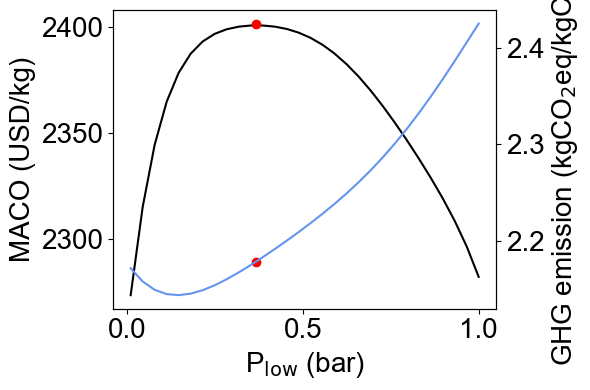

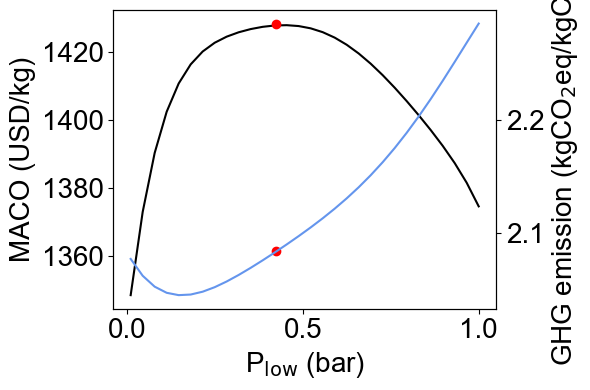

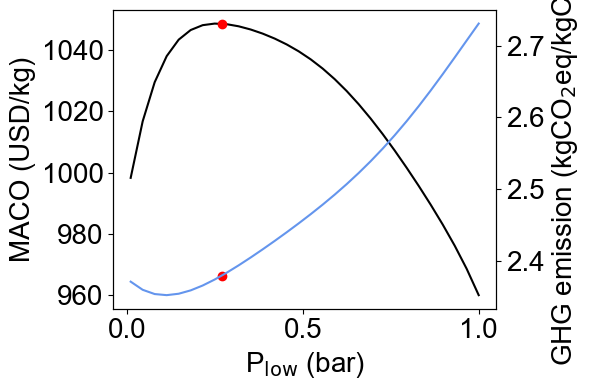

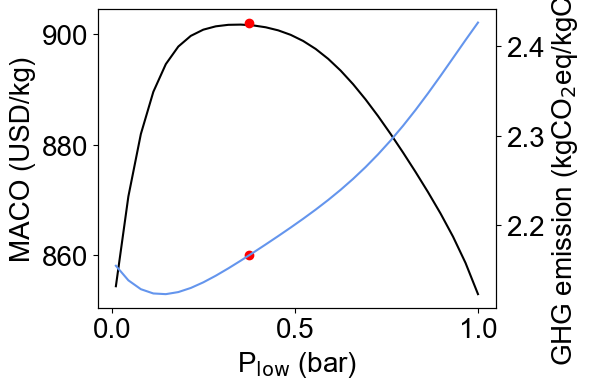

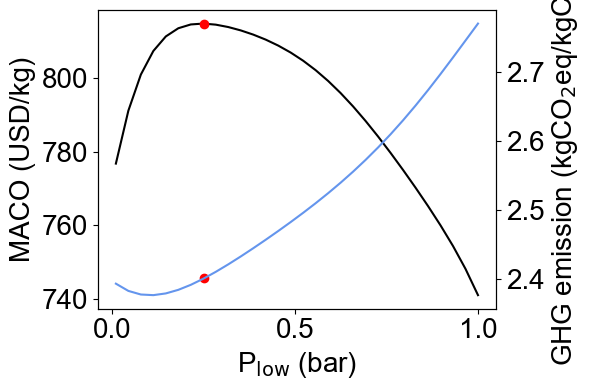

In [49]:
PSA_config='VSA'

opt_data_VSA_0=pd.read_csv('VSA_opt_Diffev.csv')
opt_data_VSA=opt_data_VSA_0.sort_values('opt_MACO_Diffev')

grid_data_VSA=pd.read_csv('VSA_grid.csv')
Pressure_range = np.linspace(0.01,1,10)


data_poly2=pd.merge(opt_data_VSA, data_poly, left_on='MOF_name', right_on='Directory')

Pv_dom = np.linspace(0.01,1,30) 

for j in range(5):
    
    fig, ax1 = plt.subplots(dpi=100, figsize=(6,4))
    ax2 = ax1.twinx()    
    
    yy = -grid_data_VSA[f'{data_poly2.iloc[j, :][1]}_MACO']
    # plt.scatter(Pressure_range, yy, c ='k')
    
    coeff1 = np.polyfit(Pressure_range, yy, 6)
    poly1 = np.poly1d(coeff1)
    MACO1_dom = poly1(Pv_dom)
     
    optimal_pressure_point=float(opt_data_VSA.iloc[j, :]['P_low'])
    optimal_MACO=opt_data_VSA.iloc[j, :]['opt_MACO_Diffev']


    # MACO plot
    ax1.plot(Pv_dom, MACO1_dom, c='k',label='MACO')
    ax1.set_ylabel('MACO (USD/kg)')
    ax1.scatter(optimal_pressure_point,-optimal_MACO, c= 'r', zorder = 2)

    
    # GHG calculation
    P_low_range=[0.01,0.04,0.07,0.1,0.3,0.5,0.7,0.9,1]

    reco_array=np.array([data_poly2.iloc[j,:][f'Re_CH4_{PSA_config}_{P_low}'] for P_low in P_low_range])
    Elec_array=np.array([PEnergy(PSA_config,P_high1, P_low, P_high2) for P_low in P_low_range]) #kWh/yr 
    GHG=(529+(1-reco_array)*390*28)/390*reco_array+(Elec_array*370/1000)/(1706697*reco_array)

    coeff_GHG = np.polyfit(P_low_range, GHG, 5)
    poly_GHG = np.poly1d(coeff_GHG)
    GHG_graph = poly_GHG(Pv_dom)

    opt_GHG = poly_GHG(optimal_pressure_point)

    # GHG emission plot
    ax2.plot(Pv_dom, GHG_graph, c='cornflowerblue',label='GHG emission')
    # ax2.scatter(P_low_range, GHG, c='cornflowerblue',label='GHG emission')
    ax2.scatter(optimal_pressure_point, opt_GHG, c='r')
    ax2.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')

    # fig.legend()
    # # Max_adsC
    # plt.title(f'{(data_poly2.iloc[j,:])[1]}')
    ax1.set_xlabel('P$\mathrm{_{low}}$ (bar)')
    plt.tight_layout()
    plt.show()


### Cascade

In [ ]:
data_poly=plot_data2_cas

#### Differential evolution

In [ ]:
import numpy as np
from scipy.optimize import minimize
from scipy.interpolate import UnivariateSpline
from scipy.optimize import differential_evolution

# Given constants
P_feed = 8  # Feed pressure (bar)
T_feed = 323.15  # Feed temperature (K)
y_feed = [0.33, 0.67]  # Feed mole fraction (mol/mol) (CO2 / CH4)
P_low = 1  # Low pressure (bar)
PSA_config = 'cas'
LC_threshold = 1.75

def objective_function(P_high):
    P_high1=P_high[0]
    P_high2=P_high[1]
    try:
        target_mof = data_poly.iloc[j, :]

        # Derive isotherms for the two gases
        mix_iso = WhichIsoFunction(target_mof)

        # Derive mixture isotherm function using IAST
        iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)

        # Perform ideal PSA process simulation (column 1)
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, y_feed)
        globals()[f'CI_{j}'].opercond(P_high1, P_low)

        x_ext1 = globals()[f'CI_{j}'].runideal()

        # Perform ideal PSA process simulation (column 2)
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, x_ext1)
        globals()[f'CI_{j}'].opercond(P_high2, P_low)

        x_ext2 = globals()[f'CI_{j}'].runideal()
    except Exception as e:
        print(f"Error: {e}")
        x_ext2 = np.array([-2023, -2023])
    
    # Recovery calculation
    CH4 = x_ext2[1]
    recovery = 1 - (CH4 * (y_feed[1] - 1)) / (y_feed[1] * (CH4 - 1))
    # MACO calculation
    C_dom = np.array([10 ** adsC for adsC in np.linspace(1, 6, 600)])
    LC_dom = [Economic(PSA_config, target_mof, adsC, target_mof['Density'], P_high1, P_low, P_high2, recovery=recovery)[-1] - LC_threshold for adsC in C_dom]
    fq = UnivariateSpline(C_dom, LC_dom)
    MACO = fq.roots()[0]

    # Constraint on GHG emissions (penalty if GHG > 2.5)
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2)
    GHG_cas=(529+(1-recovery)*390*28)/390*recovery+(Elec*370/1000)/(1706697*recovery) 
    
    penalty = 0.0
    if GHG_cas > 2.5:
        penalty = 100000 * (GHG_cas - 2.5)   # Penalty for exceeding GHG emissions

    return -MACO+ penalty

# Pressure range for grid search
Pressure_range = np.linspace(2, 14, 8)

P_high1_list=[]
P_high2_list=[]
MAX_MACO_list=[]

opt_data_cas=pd.DataFrame()
grid_data_cas=pd.DataFrame()
MOF_name=[]
index=[]
for j in range(len(data_poly)):
    print(f'#########{j}/{len(data_poly)}#########')
    bounds = [(2, 14), (2, 14)]
    # Optimization 
    try:
        result = differential_evolution(objective_function, bounds, polish=False)
        print(f"{data_poly.iloc[j, :][2]}")
        print("Optimized P_high1", result.x[0])
        print("Optimized P_high2", result.x[1])
        print("Maximum MACO:", -result.fun)
        MAX_MACO_list.append(-result.fun)
        P_high1_list.append(result['x'][0])
        P_high2_list.append(result['x'][1])
        MOF_name.append(data_poly.iloc[j, :][2])
        index.append(j)
    except Exception as e:
        print(f"Error during optimization: {e}")
        continue  # Skip to the next MOF

opt_data_cas['MOF_name']=MOF_name
opt_data_cas['P_high1']=P_high1_list
opt_data_cas['P_high2']=P_high2_list
opt_data_cas['opt_MACO_Diffev']=MAX_MACO_list

opt_data_cas.to_csv("cas_opt_Diffev.csv")


#### opt result cascade

In [26]:
df=pd.read_csv("cas_opt_Diffev.csv")
opt_data_cas=df.copy()
opt_data_cas.rename(columns={'MOF_name':'Directory'},inplace=True)
opt_data_cas['opt_MACO_Diffev'] = pd.to_numeric(opt_data_cas['opt_MACO_Diffev'], errors='coerce')
combined_data=pd.merge(data_poly,opt_data_cas, how='inner',on='Directory').dropna(subset=['opt_MACO_Diffev'])

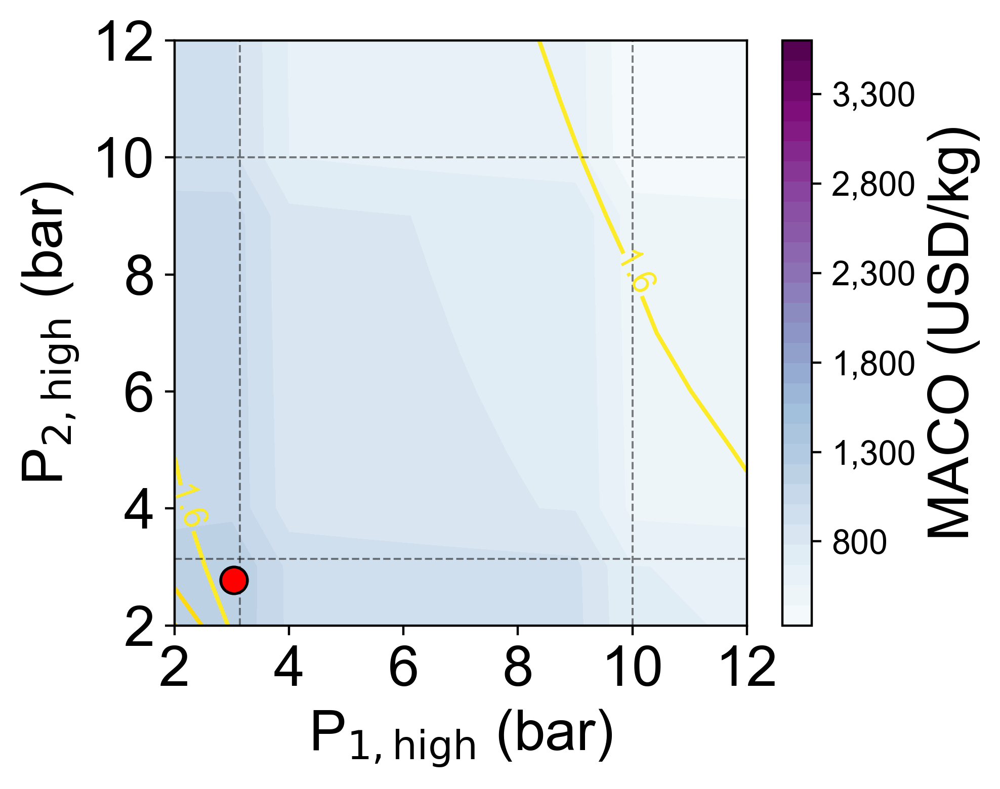

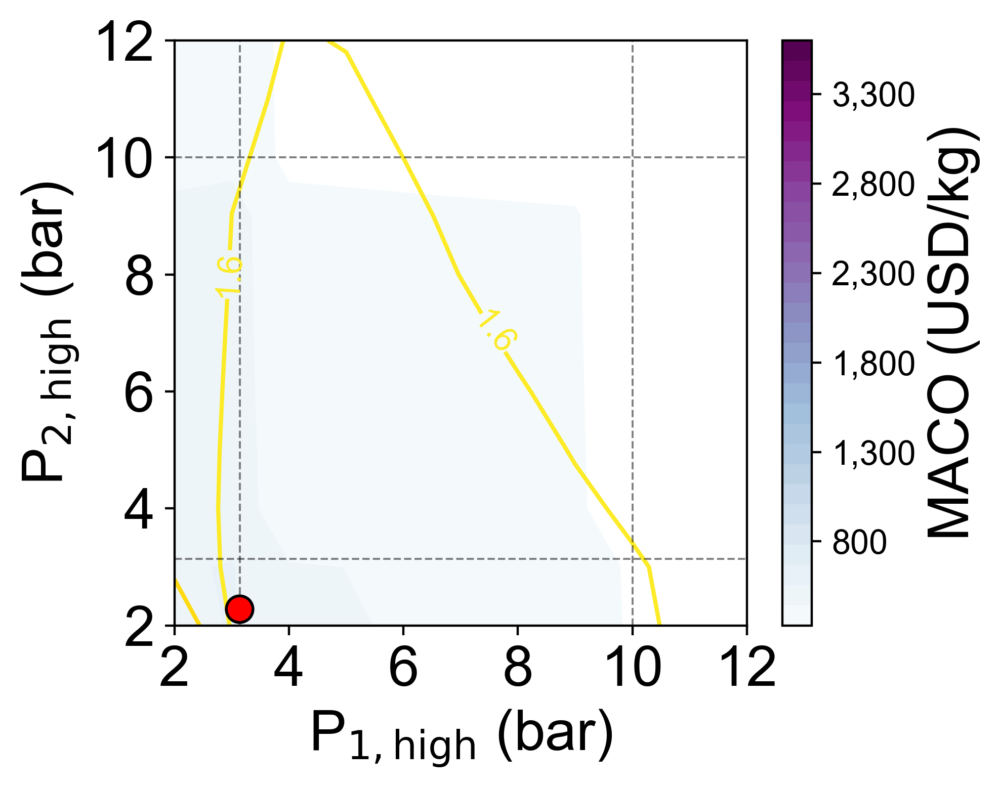

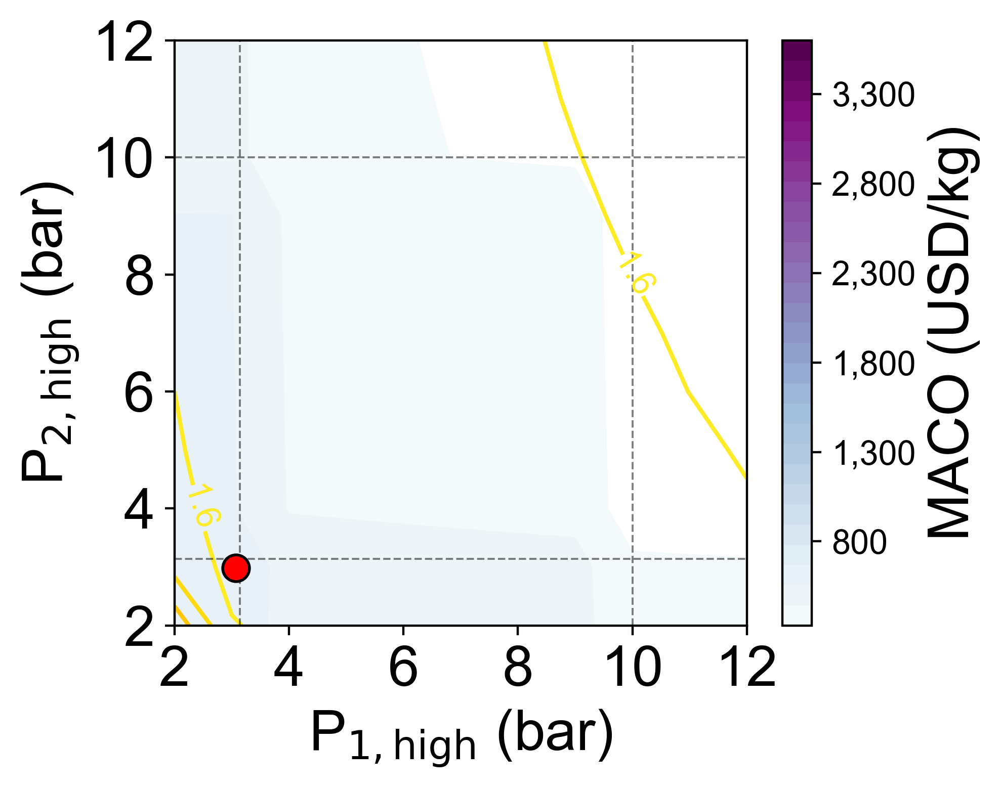

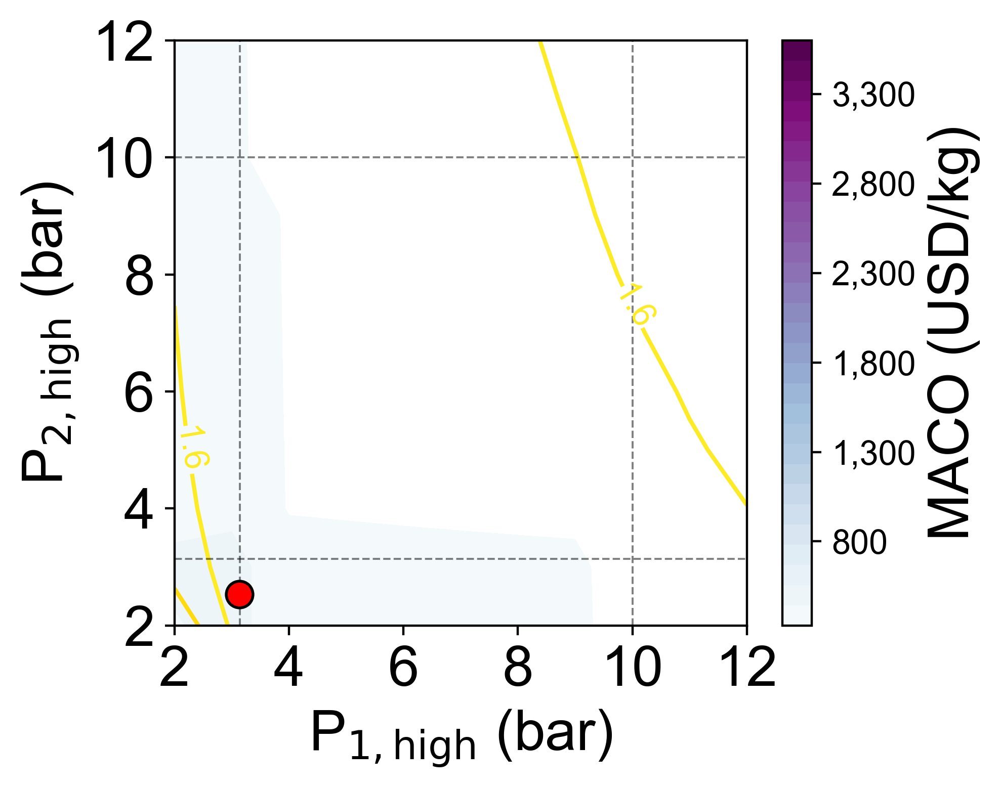

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
from matplotlib.ticker import FuncFormatter

P1 = np.linspace(2, 12, 11)
P2 = np.linspace(2, 12, 11)

levels = 50
cmap_style = 'BuPu'

PSA_config = 'cas'
P_high1 = 8
P_low = 1
P_high2 = 8
adsC = 300
LC_threshold = 1.75

min_maco = []
for i in range(4):
    plt.figure(figsize=(5, 4), dpi=400)
    mof = combined_data.iloc[i, :]
    recovery = []
    LCOM = []
    MACO = []
    GHG = []
    for P_high1 in (2,3,4,5,6,7,8,9,10,11,12):
        for P_high2 in (2,3,4,5,6,7,8,9,10,11,12):
            recovery.append(mof[f'Re_CH4_cas_{P_high1}_{P_high2}'])
            C_dom = np.array([10 ** adsC for adsC in np.linspace(1, 6, 600)])
            LC_dom = [Economic(PSA_config, mof, adsC, mof['Density'], P_high1, P_low, P_high2)[-1] - LC_threshold for adsC in C_dom]
            fq = UnivariateSpline(C_dom, LC_dom)
            MACO.append(fq.roots()[0])
            LCOM.append(Economic(PSA_config, mof, adsC, mof['Density'], P_high1, P_low, P_high2)[-1])

            Elec = PEnergy(PSA_config, P_high1, P_low, P_high2)  # kWh/yr
            GHG_stan = (529 + (1 - mof[f'Re_CH4_cas_{P_high1}_{P_high2}']) * 390 * 28) / 390 * mof[f'Re_CH4_cas_{P_high1}_{P_high2}'] + (Elec * 370 / 1000) / (1706697 * mof[f'Re_CH4_cas_{P_high1}_{P_high2}'])
            GHG.append(GHG_stan)
            
    rc_ar = np.array(recovery).reshape(11, 11)
    MACO_ar = np.array(MACO).reshape(11, 11).T
    GHG_ar = np.array(GHG).reshape(11, 11).T

    MC = plt.contourf(P1, P2, MACO_ar, cmap=cmap_style, 
                      levels = np.linspace(330, 3600, 30)
                    #   levels=levels
                      )
    plt.xlabel('P$\mathrm{_{1,high}}$ (bar)')
    plt.ylabel('P$\mathrm{_{2,high}}$ (bar)')
    plt.xticks(np.arange(2, 14, 2))
    plt.yticks(np.arange(2, 14, 2))
    # plt.title(f'{mof[2]}')

    # opt point
    opt_P1 = float(combined_data.iloc[i,:]['P_high1'])
    opt_P2 = float(combined_data.iloc[i,:]['P_high2'])
    opt_MACO = float(combined_data.iloc[i,:]['opt_MACO_Diffev'])

    # GHG contour
    CS = plt.contour(P1, P2, GHG_ar, [1.2, 1.6, 1.8, 2, 2.3, 2.5, 2.7, 3], cmap='Wistia', linewidths=1.5)
    plt.clabel(CS, inline=True, fontsize=12, fmt='%1.1f')

    # optimal point
    plt.scatter(opt_P1, opt_P2, s=90, color='r', edgecolors='k',
                label=f'MAX MACO: {opt_MACO:.0f}\n(P1, P2) = ({opt_P1:.2f}, {opt_P2:.2f})',
                zorder=5)
    plt.axhline(3.14, alpha=0.5, c='k', linestyle='--', linewidth = 0.7)
    plt.axhline(10, alpha=0.5, c='k', linestyle='--', linewidth = 0.7)
    plt.axvline(3.14, alpha=0.5, c='k', linestyle='--', linewidth = 0.7)
    plt.axvline(10, alpha=0.5, c='k', linestyle='--', linewidth = 0.7)
    # plt.legend()

    # Add individual colorbar
    def comma_format(x, pos):
        return f'{x:,.0f}'
    ticks = np.arange(300, 4001, 500)  
    cbar = plt.colorbar(MC, format=FuncFormatter(comma_format), ticks=ticks)
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label('MACO (USD/kg)')

    plt.tight_layout()
    plt.show()


#### opt result cascade 2 (P1)

In [36]:
data_poly=plot_data2_cas

df=pd.read_csv("cas_opt_Diffev.csv")
opt_data_cas=df.copy()
opt_data_cas.rename(columns={'MOF_name':'Directory'},inplace=True)
opt_data_cas['opt_MACO_Diffev'] = pd.to_numeric(opt_data_cas['opt_MACO_Diffev'], errors='coerce')
combined_data=pd.merge(data_poly,opt_data_cas, how='inner',on='Directory').dropna(subset=['opt_MACO_Diffev'])

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
from matplotlib.ticker import FuncFormatter

P1 = np.linspace(2, 12, 11)
P2 = np.linspace(2, 12, 11)

levels = 50
cmap_style = 'BuPu'

PSA_config = 'cas'
P_high1 = 8
P_low = 1
P_high2 = 8
adsC = 300
LC_threshold = 1.75


P1_dom = np.linspace(2,3.14,30)
P2_dom = np.linspace(3.14,10,30)
P3_dom = np.linspace(10,12,30)
P4_dom = np.linspace(2,12,60)
Pressure_range= [2,3,4,5,6,7,8,9,10,11,12]


P_high2 =3    # Optimal points for nearly all adsorbents
for i in range(len(combined_data)):
    mof = combined_data.iloc[i, :]
    recovery = []
    LCOM = []
    MACO = []
    GHG = []
    
    fig, ax1 = plt.subplots(dpi=100, figsize=(6,4))
    ax2 = ax1.twinx()   
    
    # Divide into segments
    yy=[mof[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'] for P_high1 in Pressure_range]
    
    #2~3bar 
    coeff1 = np.polyfit(Pressure_range[:2], yy[:2], 4)
    poly1 = np.poly1d(coeff1)
    MACO1_dom = poly1(P1_dom)
    
    #3~10bar 
    coeff2 = np.polyfit(Pressure_range[2:8], yy[2:8], 3)
    poly2 = np.poly1d(coeff2)
    MACO2_dom = poly2(P2_dom)    
    
    coeff3 = np.polyfit(Pressure_range[8:], yy[8:], 4)
    poly3 = np.poly1d(coeff3)
    MACO3_dom = poly3(P3_dom)    
    
    optimal_pressure_point = mof['P_high1']
    optimal_MACO = mof['opt_MACO_Diffev']
    
    
    # MACO plot
    # ax1.scatter(Pressure_range,yy)
    ax1.plot(P1_dom, MACO1_dom, c='k',label='MACO')
    ax1.plot(P2_dom, MACO2_dom, c='k')
    ax1.plot(P3_dom, MACO3_dom, c='k')

    ax1.vlines(3.14, ymax=MACO1_dom[-1], ymin=MACO2_dom[0], linestyles='--', color='k', alpha=0.5)
    ax1.vlines(10, ymax=MACO2_dom[-1], ymin=MACO3_dom[0], linestyles='--', color='k', alpha=0.5)
    ax1.set_ylabel('MACO (USD/kg)')
    # ax1.set_ylim(2000,3600)
    ax1.scatter(optimal_pressure_point,optimal_MACO, c= 'r', zorder = 2)
    
    # GHG emission plot
    reco_array=np.array([mof[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] for P_high1 in Pressure_range])
    Elec_array=np.array([PEnergy(PSA_config,P_high1, P_low, P_high2) for P_high1 in Pressure_range]) #kWh/yr 
    GHG=(529+(1-reco_array)*390*28)/390*reco_array+(Elec_array*370/1000)/(1706697*reco_array)

    coeff_GHG = np.polyfit(Pressure_range, GHG, 8)
    poly_GHG = np.poly1d(coeff_GHG)
    GHG_graph = poly_GHG(P4_dom)

    opt_GHG = poly_GHG(optimal_pressure_point)

    # GHG emission plot
    ax2.plot(P4_dom, GHG_graph, c='cornflowerblue',label='GHG emission')
    # ax2.scatter(Pressure_range, GHG, c='cornflowerblue',label='GHG emission')
    ax2.scatter(optimal_pressure_point, opt_GHG, c='r')
    ax2.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')


    ax1.set_xlim(1.5, 12.5)
    ax1.set_xticks(range(2, 13, 2))
        
    # plt.title(f'{mof[2]}')
    ax1.set_xlabel('P$\mathrm{_{1,high}}$ (bar)')
    plt.tight_layout()
    plt.show()

#### opt result cascade 2 (P2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
from matplotlib.ticker import FuncFormatter

P1 = np.linspace(2, 12, 11)
P2 = np.linspace(2, 12, 11)

levels = 50
cmap_style = 'BuPu'

PSA_config = 'cas'
P_high1 = 6
P_low = 1
P_high2 = 6
adsC = 300
LC_threshold = 1.75


P1_dom = np.linspace(2,3.14,30)
P2_dom = np.linspace(3.14,10,30)
P3_dom = np.linspace(10,12,30)
P4_dom = np.linspace(2,12,60)
Pressure_range= [2,3,4,5,6,7,8,9,10,11,12]


P_high1 =3    # Optimal points for nearly all adsorbents
for i in range(len(combined_data)):
    mof = combined_data.iloc[i, :]
    recovery = []
    LCOM = []
    MACO = []
    GHG = []
    
    fig, ax1 = plt.subplots(dpi=100, figsize=(6,4))
    ax2 = ax1.twinx()   
    
    # Divide into segments
    yy=[mof[f'Max_adsC_{PSA_config}_{P_high1}_{P_high2}'] for P_high2 in Pressure_range]
    
    #2~3bar 
    coeff1 = np.polyfit(Pressure_range[:2], yy[:2], 2)
    poly1 = np.poly1d(coeff1)
    MACO1_dom = poly1(P1_dom)
    
    #3~10bar 
    coeff2 = np.polyfit(Pressure_range[2:8], yy[2:8], 3)
    poly2 = np.poly1d(coeff2)
    MACO2_dom = poly2(P2_dom)    
    
    coeff3 = np.polyfit(Pressure_range[8:], yy[8:], 4)
    poly3 = np.poly1d(coeff3)
    MACO3_dom = poly3(P3_dom)    
    
    optimal_pressure_point = mof['P_high1']
    optimal_MACO = mof['opt_MACO_Diffev']
    
    
    # MACO plot
    # ax1.scatter(Pressure_range,yy)
    ax1.plot(P1_dom, MACO1_dom, c='k',label='MACO')
    ax1.plot(P2_dom, MACO2_dom, c='k')
    ax1.plot(P3_dom, MACO3_dom, c='k')

    ax1.vlines(3.14, ymax=MACO1_dom[-1], ymin=MACO2_dom[0], linestyles='--', color='k', alpha=0.5)
    ax1.vlines(10, ymax=MACO2_dom[-1], ymin=MACO3_dom[0], linestyles='--', color='k', alpha=0.5)
    ax1.set_ylabel('MACO (USD/kg)')
    ax1.scatter(optimal_pressure_point,optimal_MACO, c= 'r', zorder = 2)
    # ax1.set_ylim(2000,3600)

    # GHG emission plot
    reco_array=np.array([mof[f'Re_CH4_{PSA_config}_{P_high1}_{P_high2}'] for P_high2 in Pressure_range])
    Elec_array=np.array([PEnergy(PSA_config,P_high1, P_low, P_high2) for P_high2 in Pressure_range]) #kWh/yr 
    GHG=(529+(1-reco_array)*390*28)/390*reco_array+(Elec_array*370/1000)/(1706697*reco_array)

    coeff_GHG = np.polyfit(Pressure_range, GHG, 8)
    poly_GHG = np.poly1d(coeff_GHG)
    GHG_graph = poly_GHG(P4_dom)

    opt_GHG = poly_GHG(optimal_pressure_point)

    # GHG emission plot
    ax2.plot(P4_dom, GHG_graph, c='cornflowerblue',label='GHG emission')
    # ax2.scatter(Pressure_range, GHG, c='cornflowerblue',label='GHG emission')
    ax2.scatter(optimal_pressure_point, opt_GHG, c='r')
    ax2.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')

    ax1.set_xlim(1.5, 12.5)
    ax1.set_xticks(range(2, 13, 2))
    
    # plt.title(f'{mof[2]}')
    ax1.set_xlabel('P$\mathrm{_{2,high}}$ (bar)')
    plt.tight_layout()
    plt.show()

### Opt comparison

In [40]:
# data import

df_psa = pd.read_csv('PSA_opt_Diffev.csv').sort_values(by='opt_MACO_Diffev',ascending=True)
df_vsa = pd.read_csv('VSA_opt_Diffev.csv').sort_values(by='opt_MACO_Diffev',ascending=True)
df_cas = pd.read_csv("cas_opt_Diffev.csv")
df_cas.rename(columns={'MOF_name':'Directory'},inplace=True)
df_cas['opt_MACO_Diffev'] = pd.to_numeric(df_cas['opt_MACO_Diffev'], errors='coerce')

In [41]:
# stats
MACO_stat =[]
for _df in [df_psa, df_vsa, df_cas]:
    av10 = np.abs(np.mean(_df.iloc[:10,:]['opt_MACO_Diffev']))
    av30 = np.abs(np.mean(_df.iloc[:30,:]['opt_MACO_Diffev']))
    av50 = np.abs(np.mean(_df.iloc[:50,:]['opt_MACO_Diffev']))
    avTot = np.abs(np.mean(_df['opt_MACO_Diffev']))
    MACO_stat += [av10, av30, av50, avTot]

In [42]:
df_before = pd.read_csv('8. All_data_LCOM=1.75.csv')
col_names = ['Max_adsC_PSA_8','Max_adsC_VSA_0.1','Max_adsC_cas_8_8']

MACO_stat_before =[]
for _col, _df in zip(col_names, [df_psa, df_vsa, df_cas]):
    before_maco = df_before[['Directory', _col]]
    
    if _col == col_names[-1]:
        _tmp_df = pd.merge(_df, before_maco, left_on = 'Directory', right_on='Directory', how='left')
    else:
        _tmp_df = pd.merge(_df, before_maco, left_on = 'MOF_name', right_on='Directory', how='left')
    
    
    target = _tmp_df[_col].sort_values(ascending=False)
    
    print(len(target))
    av10 = np.abs(np.mean(target.iloc[:10]))
    av30 = np.abs(np.mean(target.iloc[:30]))
    av50 = np.abs(np.mean(target.iloc[:50]))
    avTot = np.abs(np.mean(target))
    MACO_stat_before += [av10, av30, av50, avTot]

120
138
107


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\2082329516.py:1: DtypeWarning: Columns (25,26,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  df_before = pd.read_csv('8. All_data_LCOM=1.75.csv')


In [43]:
data = {
    'Category': ['PSA', 'PSA', 'PSA', 'PSA', 'VSA', 'VSA', 'VSA', 'VSA', 'cascade PSA', 'cascade PSA', 'cascade PSA', 'cascade PSA'],
    'Type': ['Top 10', 'Top 30', 'Top 50', 'Total', 'Top 10', 'Top 30', 'Top 50', 'Total', 'Top 10', 'Top 30', 'Top 50', 'Total'],
    'Average Price': MACO_stat,
    'Pre-Optimization': MACO_stat_before  # before optimization
}


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\911240778.py:51: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  sc = ax.scatter(index + i * bar_width, pre_opt_values, color='white',


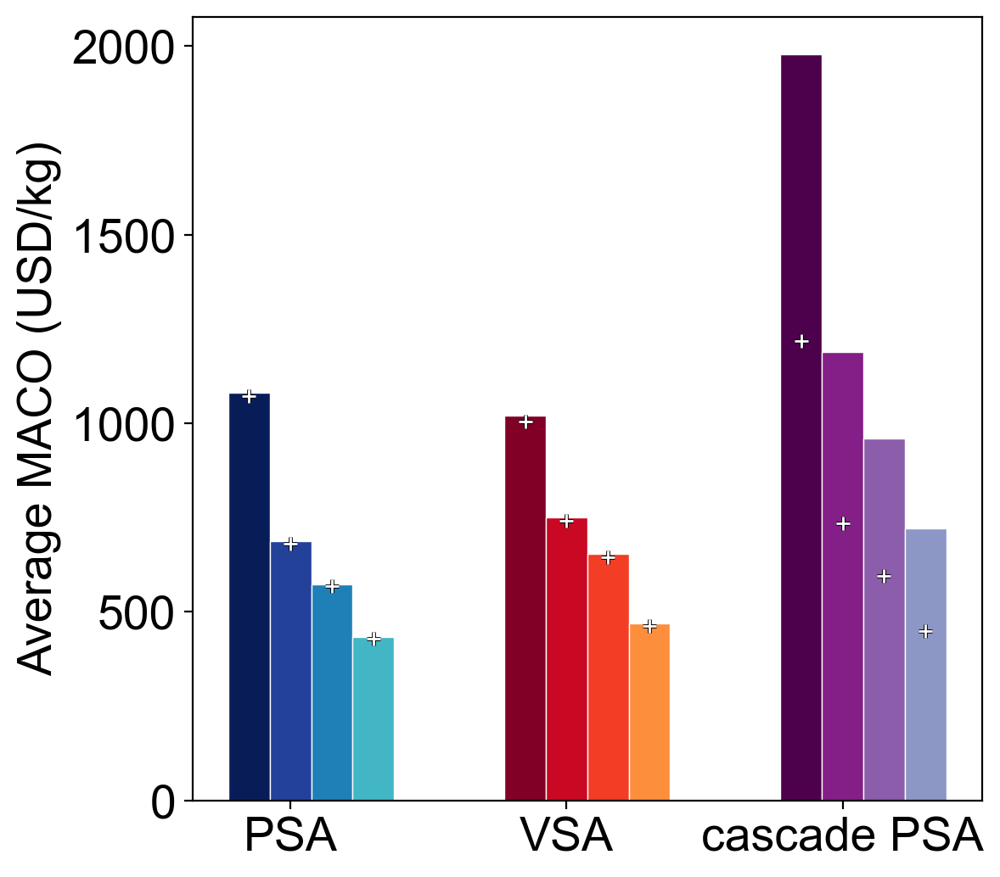

In [44]:
from matplotlib.colors import to_rgba
import matplotlib.cm as cm


parameters = {'axes.labelsize': 20,
              'xtick.labelsize': 20,
              'ytick.labelsize': 20,
              'legend.fontsize': 13,
          'axes.titlesize': 20}
plt.rcParams.update(parameters)
plt.rcParams['font.family'] = 'arial'



df = pd.DataFrame(data)


def get_colors(palette, n_colors):
    return [palette(i / (n_colors + 2)) for i in range(n_colors)]

psa_colors = get_colors(cm.YlGnBu_r, len(df['Type'].unique()))
vsa_colors = get_colors(cm.YlOrRd_r, len(df['Type'].unique()))
cascade_colors = get_colors(cm.BuPu_r, len(df['Type'].unique()))


color_map = {
    'PSA': psa_colors,
    'VSA': vsa_colors,
    'cascade PSA': cascade_colors
}

# bar plot
types = df['Type'].unique()
bar_width = 0.15
index = np.arange(len(df['Category'].unique()))

fig, ax = plt.subplots(figsize=(6,6), dpi=200)

for i, t in enumerate(types):
    values = df[df['Type'] == t]['Average Price']
    category_colors = [color_map[cat][i] for cat in df['Category'].unique()]
    ax.bar(index + i * bar_width, values, bar_width, label=t, color=category_colors, edgecolor = 'white', linewidth = 0.5)
    pre_opt_values = df[df['Type'] == t]['Pre-Optimization']
    sc = ax.scatter(index + i * bar_width, pre_opt_values, color='white',
               edgecolors='k', zorder=5, marker='+', linewidths=1, s=30)  # Display pre-optimization results as black dots
    ax.scatter(index + i * bar_width, pre_opt_values, linewidths=1.7, s=35, color='k', alpha=1, marker='+') 

# ax.set_xlabel('     PSA               VSA       Cascade PSA')
ax.set_ylabel('Average MACO (USD/kg)')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(df['Category'].unique())

handles, labels = ax.get_legend_handles_labels()
bw_legend = [plt.Line2D([0], [0], color='black', lw=4, alpha=alpha) for alpha in np.linspace(1, 0.2, len(handles))]
# ax.legend(bw_legend, labels, loc='upper left')
# plt.yticks([], [])
plt.show()


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\3802968555.py:40: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(bar_positions, pre_opt_values, color='white',


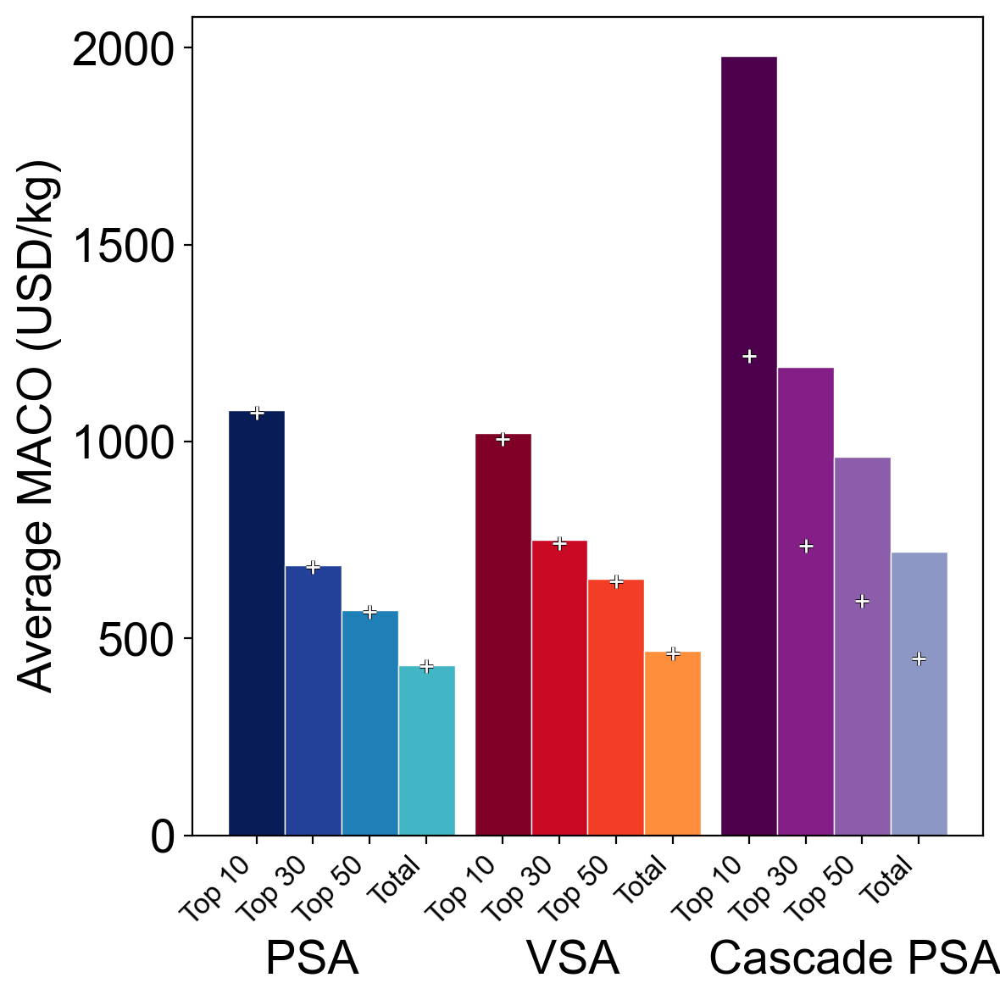

In [45]:
df = pd.DataFrame(data)

types = df['Type'].unique()
categories = df['Category'].unique()
bar_width = 0.23

index = np.arange(len(categories))

fig, ax = plt.subplots(figsize=(6,6), dpi=200)

xticks_labels = []  
xticks_positions = []  

def get_colors(palette, n_colors):
    return [palette(i / (n_colors + 2)) for i in range(n_colors)]

psa_colors = get_colors(cm.YlGnBu_r, len(df['Type'].unique()))
vsa_colors = get_colors(cm.YlOrRd_r, len(df['Type'].unique()))
cascade_colors = get_colors(cm.BuPu_r, len(df['Type'].unique()))

color_map = {
    'PSA': psa_colors,
    'VSA': vsa_colors,
    'cascade PSA': cascade_colors
}

for i, t in enumerate(types):
    values = df[df['Type'] == t]['Average Price']
    category_colors = [color_map[cat][i] for cat in categories]
    bar_positions = index + i * bar_width
    ax.bar(bar_positions, values, bar_width, label=t, color=category_colors, edgecolor = 'white', linewidth = 0.5)
    
    pre_opt_values = df[df['Type'] == t]['Pre-Optimization']
    ax.scatter(bar_positions, pre_opt_values, color='white',
               edgecolors='k', zorder=5, marker='+', linewidths=1, s=30)
    ax.scatter(bar_positions, pre_opt_values, linewidths=1.7, s=35, color='k', alpha=1, marker='+')
    
    xticks_labels.extend([f'{t}' for cat in categories])
    xticks_positions.extend(bar_positions)

ax.set_ylabel('Average MACO (USD/kg)')
ax.set_xlabel('       PSA             VSA       Cascade PSA')
ax.set_xticks(xticks_positions)
ax.set_xticklabels(xticks_labels, rotation=45, ha='right',fontsize=12)

handles, labels = ax.get_legend_handles_labels()
bw_legend = [plt.Line2D([0], [0], color='black', lw=4, alpha=alpha) for alpha in np.linspace(1, 0.2, len(handles))]
plt.tight_layout()
plt.show()


# Etc.

## Isotherm Plots

In [46]:
data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')
data_clean

PSA_config = 'PSA'
for P_high1 in (4,6,8,10,12,14,16,18,20):
    data_clean = data_clean[(data_clean[f'Max_adsC_{PSA_config}_{P_high1}'] < 10**10)&(data_clean[f'Re_CH4_{PSA_config}_{P_high1}']<1)]

isotherm_data= data_clean.copy()


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_50360\3359737475.py:1: DtypeWarning: Columns (25,26,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')


### CO2 isotherm

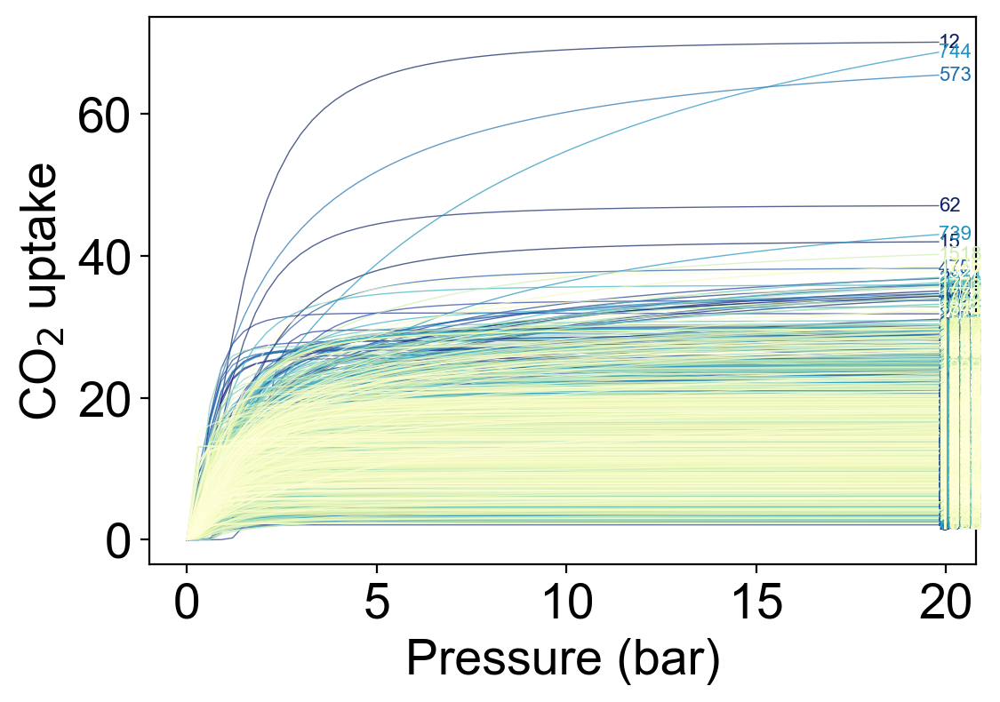

In [47]:
iso = len(isotherm_data)-1
cmap_case = plt.get_cmap('YlGnBu_r')
num_colors = iso+3
colors = cmap_case(np.linspace(0, 1, num_colors))[:len(isotherm_data)]

p = np.arange(0,20,0.3)
plt.figure(dpi=200, figsize=(6,4))
mix_iso_p_1=[]
mix_iso_p_2=[]
for i in range(len(isotherm_data)):
    target = isotherm_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[0]    # CO2 isotherm extraction
    mix_iso_p_1.append(mix_iso(p[16],298))
    mix_iso_p_2.append(mix_iso(p[-1],298))
    plt.plot(p, mix_iso(p,298), linewidth = 0.5,c=colors[i], alpha=0.7)
    plt.text(p[-1], mix_iso(p[-1], 298), str(i), color=colors[i], fontsize=8, ha='left', va='center')
isotherm_data['mix_iso_p_1'] = mix_iso_p_1
isotherm_data['mix_iso_p_2'] = mix_iso_p_2
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CO$_2$ uptake')
plt.show()


early_sat_CO2_0=isotherm_data[(isotherm_data['mix_iso_p_1']>0.99*isotherm_data['mix_iso_p_2'])]
early_sat_CO2=early_sat_CO2_0.sort_values(by='Re_CH4_PSA_6',ascending=True)

late_sat_CO2_0=isotherm_data[(isotherm_data['mix_iso_p_1']<0.70*isotherm_data['mix_iso_p_2'])]
late_sat_CO2=late_sat_CO2_0.sort_values(by='Re_CH4_PSA_6',ascending=True)

# 65% = late sat
# 99% = early sat 

### CH4 isotherm

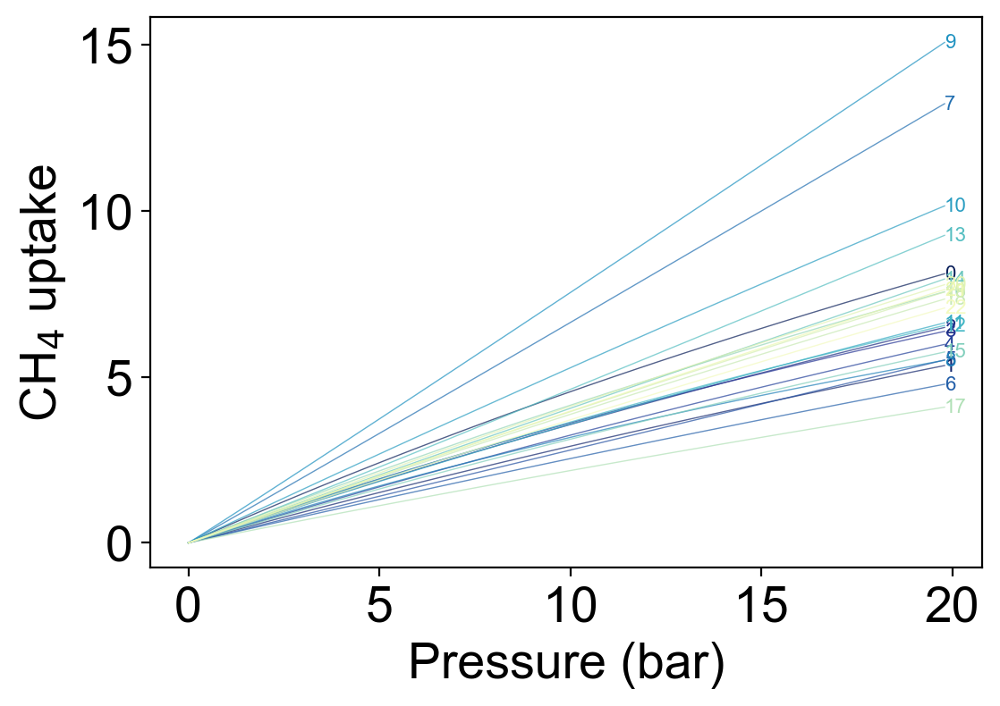

In [48]:

target_data=late_sat_CO2
iso = len(target_data)-1
cmap_case = plt.get_cmap('YlGnBu_r')
num_colors = iso+3
colors = cmap_case(np.linspace(0, 1, num_colors))[:len(target_data)]

p = np.arange(0,20,0.3)
plt.figure(dpi=200, figsize=(6,4))
mix_iso_p_1=[]
mix_iso_p_2=[]
for i in range(len(target_data)):
    target = target_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[1]    #CH4 isotherm
    mix_iso_p_1.append(mix_iso(p[16],298))
    mix_iso_p_2.append(mix_iso(p[-1],298))
    plt.plot(p, mix_iso(p,298), linewidth = 0.5,c=colors[i], alpha=0.7)
    plt.text(p[-1], mix_iso(p[-1], 298), str(i), color=colors[i], fontsize=8, ha='left', va='center')
target_data['mix_iso_p_1'] = mix_iso_p_1
target_data['mix_iso_p_2'] = mix_iso_p_2
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CH$_4$ uptake')
plt.show()


### Mixture isotherm (early sat)

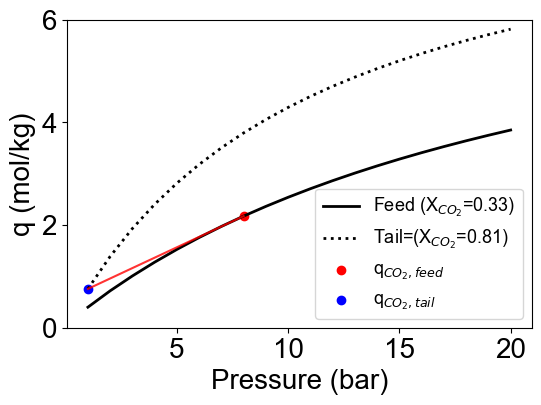

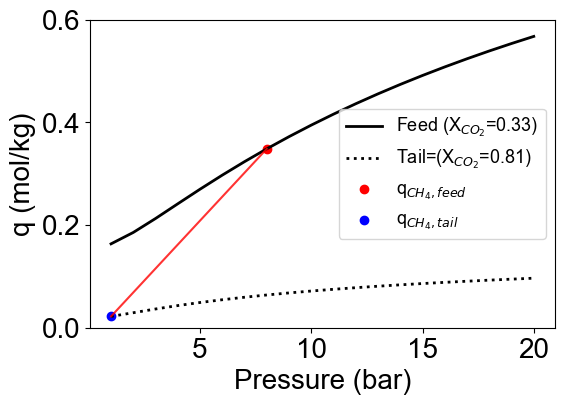

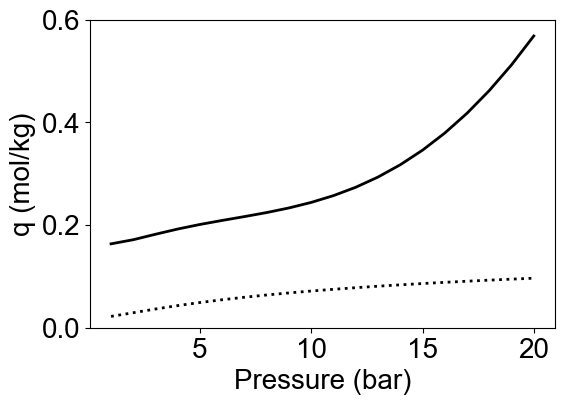

c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\pyapep\isofit.py:480: RuntimeWarning: invalid value encountered in divide
  q_P = iso(P_ran, T)/P_ran
c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\pyapep\isofit.py:446: RuntimeWarning: invalid value encountered in divide
  q_ov_P = isoPT(P_ran, T)/P_ran
c:\Users\Seunggwan Yun\Desktop\virtual\Biogas\lib\site-packages\pyapep\isofit.py:544: RuntimeWarning: invalid value encountered in divide
  q_tot = 1/(np.sum(x_re/q_pure))


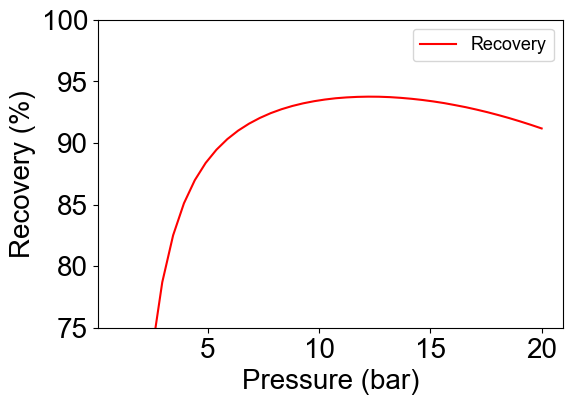

In [49]:
import matplotlib.pyplot as plt

# Arbitrary selection
i = 3  # Select the adsorbent you want
data = early_sat_CO2

# CO2, CH4 pure isotherm
isotherm_input = data.iloc[i, :]                   # Input data: early & late saturation settings
mix_iso = WhichIsoFunction(isotherm_input)         # Pure isotherm function

# Extract CO2 and CH4 isotherm functions
mix_iso_CO2 = mix_iso[0]  # CO2 isotherm
mix_iso_CH4 = mix_iso[1]  # CH4 isotherm

# Mixture isotherm function
iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)    # Mixture isotherm using IAST

y_feed = [0.33, 0.67]  # Feed mole fraction

# Pressure range
pressure = range(1, 21)

# Feed Mixture Isotherm
results_F = [] 
for P in pressure:
    result = iso_mix([y_feed[0] * P, y_feed[1] * P], 298)
    results_F.append(result)

CO2_mixture_isotherm_F = [row[0] for row in results_F]  # CO2 mixture isotherm
CH4_mixture_isotherm_F = [row[1] for row in results_F]  # CH4 mixture isotherm

# Tail gas composition conditions
PSA_config = 'PSA'
P_high1 = 8
P_low = 1

pu_CO2 = isotherm_input[f'pu_CO2_{PSA_config}_{P_high1}']
pu_CH4 = isotherm_input[f'pu_CH4_{PSA_config}_{P_high1}']

results_T = []
for P in pressure:
    result = iso_mix([pu_CO2 * P, pu_CH4 * P], 298)
    results_T.append(result)

CO2_mixture_isotherm_T = [row[0] for row in results_T]  # CO2 tail mixture isotherm
CH4_mixture_isotherm_T = [row[1] for row in results_T]  # CH4 tail mixture isotherm

alpha = 0.8

# Plot CO2 Mixture Isotherm
plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, CO2_mixture_isotherm_F, linewidth=2, c='black', label='Feed (X$_{CO_{2}}$=0.33)')
plt.plot(pressure, CO2_mixture_isotherm_T, linewidth=2, c='black', linestyle=':', label=f'Tail (X$_{{CO_{{2}}}}$={pu_CO2:.2f})')

plt.scatter(P_high1, CO2_mixture_isotherm_F[P_high1-1], c='red', label='q$_{{CO_{{2}}},feed}$')  # 8 bar feed condition
plt.scatter(P_low, CO2_mixture_isotherm_T[0], c='blue', label='q$_{{CO_{{2}}},tail}$')          # 1 bar tail condition
plt.plot((P_low, P_high1), (CO2_mixture_isotherm_T[0], CO2_mixture_isotherm_F[P_high1-1]), c='red', alpha=alpha)

plt.ylim(0, 6)
plt.xlabel('Pressure (bar)')
plt.ylabel('q (mol/kg)')
plt.legend()
plt.show()

# Plot CH4 Mixture Isotherm
plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, CH4_mixture_isotherm_F, linewidth=2, c='black', label='Feed (X$_{CO_{2}}$=0.33)')
plt.plot(pressure, CH4_mixture_isotherm_T, linewidth=2, c='black', linestyle=':', label=f'Tail (X$_{{CO_{{2}}}}$={pu_CO2:.2f})')

plt.scatter(P_high1, CH4_mixture_isotherm_F[P_high1-1], c='red', label='q$_{{CH_{{4}}},feed}$')  # 8 bar feed condition
plt.scatter(P_low, CH4_mixture_isotherm_T[0], c='blue', label='q$_{{CH_{{4}}},tail}$')          # 1 bar tail condition
plt.plot((P_low, P_high1), (CH4_mixture_isotherm_T[0], CH4_mixture_isotherm_F[P_high1-1]), c='red', alpha=alpha)

plt.ylim(0, 0.6)
plt.xlabel('Pressure (bar)')
plt.ylabel('q (mol/kg)')
plt.legend()
plt.show()

#### Recovery ####

def Reco(P_high1):
    try:
        # Load data
        target_cof = isotherm_input

        # Derive isotherms for two gases
        mix_iso = WhichIsoFunction(target_cof)

        # Define iso_mix function for IAST
        iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)

        # Define modified iso_mix_rev
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, y_feed)
        globals()[f'CI_{j}'].opercond(P_high1, P_low)

        # Derive tail gas composition
        x_ext = globals()[f'CI_{j}'].runideal()

    except Exception as e:
        print(f"An error occurred: {e}")
        x_ext = np.array([-2023, -2023])

    CH4 = x_ext[1]
    recovery = 1 - (CH4 * (y_feed[1] - 1)) / (y_feed[1] * (CH4 - 1))
    return recovery

pressure2 = list(np.linspace(1


### early sat

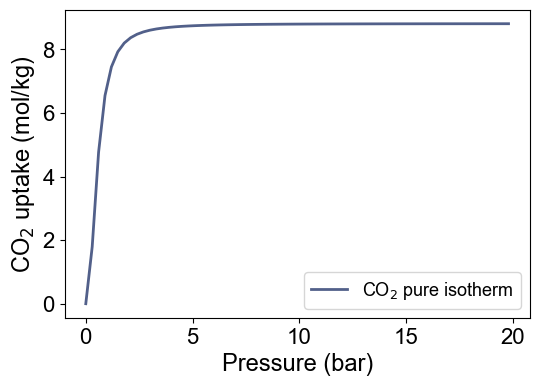

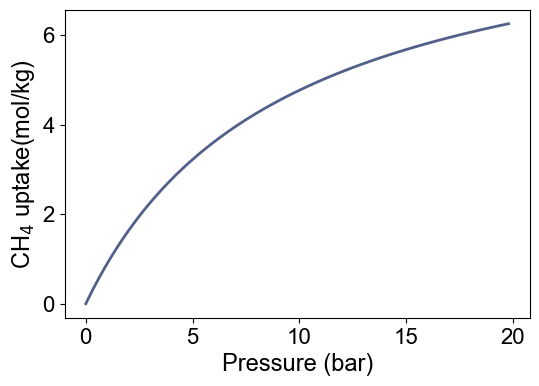

C:\Users\Seunggwan Yun\AppData\Local\Temp\ipykernel_11324\1331551046.py:61: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[ii+5], alpha=0.8, s=40,label=f'P$_1$,$_h$$_i$$_g$$_h$={P_high1}')
C:\Users\Seunggwan Yun\AppData\Local\Temp\ipykernel_11324\1331551046.py:61: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_co

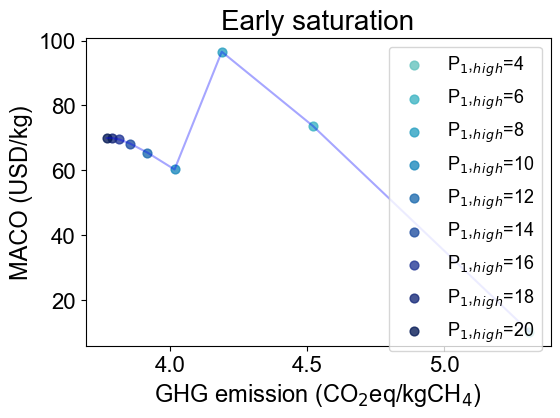

Text(0.5, 0, 'Pressure (bar)')

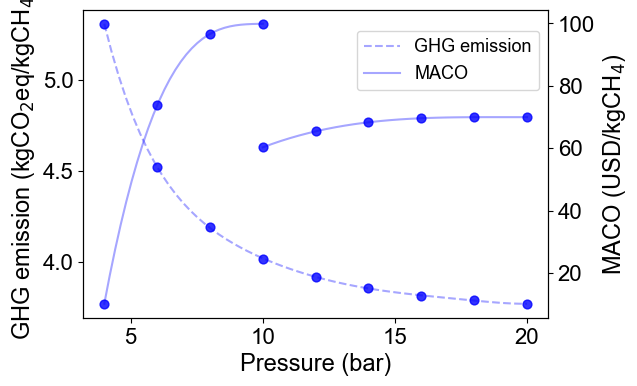

In [ ]:
i=3
plot_data= early_sat_CO2.iloc[i:i+1,:]
iso = len(plot_data)-1
cmap_case = plt.get_cmap('YlGnBu_r')
num_colors = iso+30
colors = cmap_case(np.linspace(0, 1, num_colors))[:len(plot_data)]

plt.figure(dpi=100, figsize=(6,4))
for i in range(len(plot_data)):
    target = plot_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[0]
    plt.plot(p, mix_iso(p,298), linewidth = 2,c=colors[i], alpha=0.7,label='CO$_2$ pure isotherm')
    mof_name=plot_data.iloc[i,:]['Directory']
    # plt.text(p[-1], mix_iso(p[-1], 298), f'{mof_name}', color=colors[i], fontsize=8, ha='left', va='center')
    
# plt.title('Early saturation')
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CO$_2$ uptake (mol/kg)')
plt.legend()
plt.show()


plt.figure(dpi=100, figsize=(6,4))
for i in range(len(plot_data)):
    target = plot_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[1]
    plt.plot(p, mix_iso(p,298), linewidth = 2,c=colors[i], alpha=0.7)
    mof_name=plot_data.iloc[i,:]['Directory']
    # plt.text(p[-1], mix_iso(p[-1], 298), f'{mof_name}', color=colors[i], fontsize=8, ha='left', va='center')
# plt.title('Early saturation')
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CH$_4$ uptake(mol/kg)')
plt.show()


P_high1=8
P_high2=8
P_low =1
PSA_config = 'PSA'

plt.figure(dpi=100, figsize=(6,4))
ii=0
GHG_list=pd.DataFrame()
MACO_list=pd.DataFrame()
for P_high1 in (4,6,8,10,12,14,16,18,20):
    ii=ii+1
    cmap_case = plt.get_cmap('YlGnBu')
    num_colors = 15
    colors = cmap_case(np.linspace(0, 1, num_colors))   
    plt.title('Early saturation')
    plt.ylabel('MACO (USD/kg)')
    plt.xlabel(f'GHG emission (CO$_2$eq/kgCH$_4$)')
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2) #kWh/yr 
    reco=plot_data[f'Re_CH4_{PSA_config}_{P_high1}']
    GHG=(529+(1-reco)*390*28)/390*reco+(Elec*370/1000)/(1706697*reco)
    MACO=plot_data[f'Max_adsC_{PSA_config}_{P_high1}']
    GHG_list[f'GHG_{P_high1}']=GHG
    MACO_list[f'MACO_{P_high1}']=MACO
    plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[ii+5], alpha=0.8, s=40,label=f'P$_1$,$_h$$_i$$_g$$_h$={P_high1}')
        
    plt.legend()
# plt.plot((plot_data[f'Re_CH4_{PSA_config}_6']*100,plot_data[f'Re_CH4_{PSA_config}_14']*100), (plot_data[f'Max_adsC_{PSA_config}_6'],plot_data[f'Max_adsC_{PSA_config}_14']), c='r', alpha=0.07)
plt.plot([(529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']+(PEnergy(PSA_config,P_high1, P_low, P_high2)*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']) for P_high1 in (4,6,8,10,12,14,16,18,20)], [plot_data[f'Max_adsC_{PSA_config}_{P_high1}'] for P_high1 in (4,6,8,10,12,14,16,18,20)], c='b', alpha=0.35)
plt.show()

    
fig, ax1 = plt.subplots(dpi=100, figsize=(6, 4))
ax2 = ax1.twinx()
pressures = list(range(4, 22, 2))



coeff_early_G=np.polyfit(pressures,([GHG_list.iloc[0,i] for i in range(9)]),6)
poly_early_G= np.poly1d(coeff_early_G)
pressures_G=np.linspace(4,20,60)
GHG_early=poly_early_G(pressures_G)

ax1.scatter(pressures,([GHG_list.iloc[0,i] for i in range(9)]) ,c='b',alpha=0.8, s=40)
ax1.plot(pressures_G,GHG_early,linestyle='--',c='b',alpha=0.35,label='GHG emission')

ax1.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')

before=[]
before=[MACO_list.iloc[0,i] for i in range(9)][:3]
before.append((before[2]-before[1])/7+before[2])
coeff_early=np.polyfit(pressures[:4],before,3)
poly_early = np.poly1d(coeff_early)
pressure1=np.linspace(4,10,30)
MACO_early=poly_early(pressure1)

coeff_early2=np.polyfit(pressures[3:],[MACO_list.iloc[0,i] for i in range(9)][3:],3)
poly_early2 = np.poly1d(coeff_early2)
pressure2=np.linspace(10,20,30)
MACO_early2=poly_early2(pressure2)


# ax2.plot(pressures[:4],before,c='b',alpha=0.35)
ax2.plot(pressure1,MACO_early,c='b',alpha=0.35)

ax2.plot(pressure2,MACO_early2,c='b',alpha=0.35, label='MACO')

ax2.scatter(pressures[3],before[3],c='b',alpha=0.8, s=40)
ax2.scatter(pressures,([MACO_list.iloc[0,i] for i in range(9)]),c='b',alpha=0.8, s=40)
ax2.set_ylabel('MACO (USD/kgCH$_4$)')

fig.legend(bbox_to_anchor=(0.9, 0.85))

ax2.set_xlabel('Pressure (bar)')
ax1.set_xlabel('Pressure (bar)')


### Mixture isotherm (late sat)

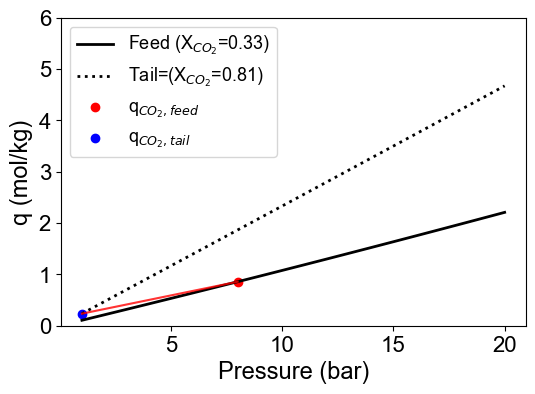

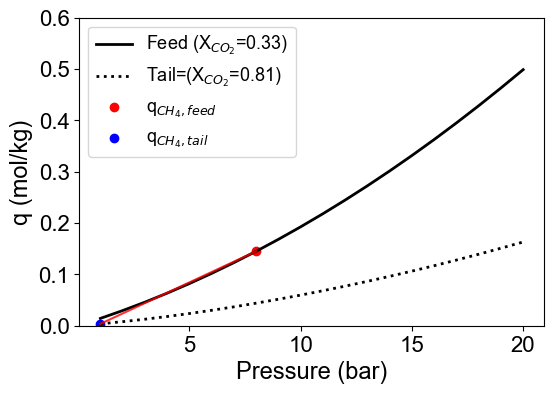

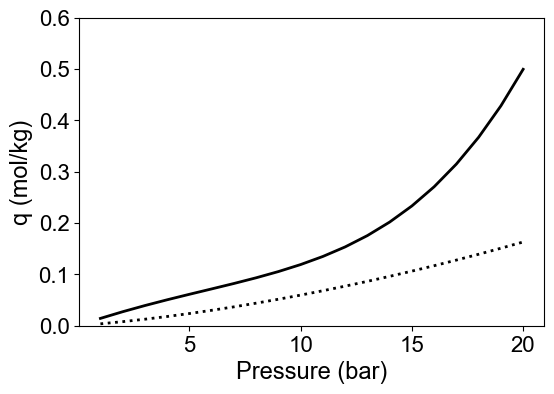

c:\Users\Seunggwan Yun\AppData\Local\Programs\Python\Python38\lib\site-packages\pyapep\isofit.py:480: RuntimeWarning: invalid value encountered in divide
  q_P = iso(P_ran, T)/P_ran
c:\Users\Seunggwan Yun\AppData\Local\Programs\Python\Python38\lib\site-packages\pyapep\isofit.py:446: RuntimeWarning: invalid value encountered in divide
  q_ov_P = isoPT(P_ran, T)/P_ran
c:\Users\Seunggwan Yun\AppData\Local\Programs\Python\Python38\lib\site-packages\pyapep\isofit.py:544: RuntimeWarning: invalid value encountered in divide
  q_tot = 1/(np.sum(x_re/q_pure))


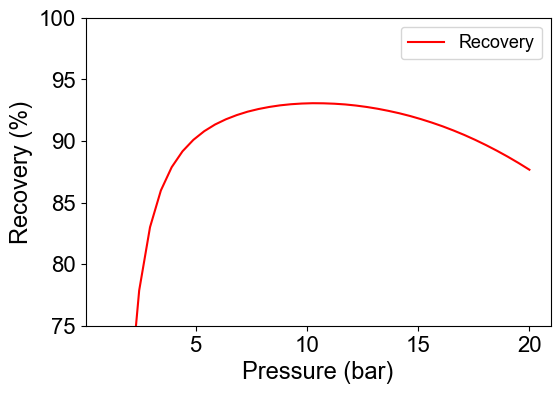

In [ ]:

y_feed = [0.33, 0.67]

# Arbitrary selection
i = 5
data = late_sat_CO2

# CO2, CH4 pure isotherm
isotherm_input = data.iloc[i, :]  # Input data: set early & late saturation here
mix_iso = WhichIsoFunction(isotherm_input)  # Pure isotherm

# Extract CO2 and CH4 pure isotherm functions
mix_iso_CO2 = mix_iso[0]  # CO2 isotherm
mix_iso_CH4 = mix_iso[1]  # CH4 isotherm

# Mixture isotherm function using IAST
iso_mix = lambda P, T: isof.IAST(mix_iso, P, T)

# Pressure range
pressure = range(1, 21)

# Feed mixture isotherm results
results_F = [] 
for P in pressure:
    result = iso_mix([y_feed[0] * P, y_feed[1] * P], 298)
    results_F.append(result)

CO2_mixture_isotherm_F = [row[0] for row in results_F]  # CO2 mixture isotherm
CH4_mixture_isotherm_F = [row[1] for row in results_F]  # CH4 mixture isotherm

# Tail gas composition conditions
PSA_config = 'PSA'
P_high1 = 8
P_low = 1

pu_CO2 = isotherm_input[f'pu_CO2_{PSA_config}_{P_high1}']
pu_CH4 = isotherm_input[f'pu_CH4_{PSA_config}_{P_high1}']

# Tail mixture isotherm results
results_T = []
for P in pressure:
    result = iso_mix([pu_CO2 * P, pu_CH4 * P], 298)
    results_T.append(result)

CO2_mixture_isotherm_T = [row[0] for row in results_T]  # CO2 tail mixture isotherm
CH4_mixture_isotherm_T = [row[1] for row in results_T]  # CH4 tail mixture isotherm

alpha = 0.8

# Plot CO2 Mixture Isotherm
plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, CO2_mixture_isotherm_F, linewidth=2, c='black', label='Feed (X$_{CO_{2}}$=0.33)')
plt.plot(pressure, CO2_mixture_isotherm_T, linewidth=2, c='black', linestyle=':', label=f'Tail (X$_{{CO_{{2}}}}$={pu_CO2:.2f})')

plt.scatter(P_high1, CO2_mixture_isotherm_F[P_high1-1], c='red', label='q$_{{CO_{{2}}},feed}$')  # Feed condition
plt.scatter(P_low, CO2_mixture_isotherm_T[0], c='blue', label='q$_{{CO_{{2}}},tail}$')  # Tail condition
plt.plot((P_low, P_high1), (CO2_mixture_isotherm_T[0], CO2_mixture_isotherm_F[P_high1-1]), c='red', alpha=alpha)

plt.ylim(0, 6)
plt.xlabel('Pressure (bar)')
plt.ylabel('q (mol/kg)')
plt.legend()
plt.show()

# Plot CH4 Mixture Isotherm
plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, CH4_mixture_isotherm_F, linewidth=2, c='black', label='Feed (X$_{CO_{2}}$=0.33)')
plt.plot(pressure, CH4_mixture_isotherm_T, linewidth=2, c='black', linestyle=':', label=f'Tail (X$_{{CO_{{2}}}}$={pu_CO2:.2f})')

plt.scatter(P_high1, CH4_mixture_isotherm_F[P_high1-1], c='red', label='q$_{{CH_{{4}}},feed}$')  # Feed condition
plt.scatter(P_low, CH4_mixture_isotherm_T[0], c='blue', label='q$_{{CH_{{4}}},tail}$')  # Tail condition
plt.plot((P_low, P_high1), (CH4_mixture_isotherm_T[0], CH4_mixture_isotherm_F[P_high1-1]), c='red', alpha=alpha)

plt.ylim(0, 0.6)
plt.xlabel('Pressure (bar)')
plt.ylabel('q (mol/kg)')
plt.legend()
plt.show()

#### Recovery Calculation ####

# Adjust slope for CH4 isotherm
def f(x):  # Steeper slope
    a = 0.00946
    b = -0.133
    c = 1.085
    return a * x**2 + b * x + c

def iso_mix_rev(P, T):  # Adjust CH4 values
    results = iso_mix(P, T)
    CO2 = results[0]
    CH4 = results[1] * f(P[1])  # Steeper slope adjustment
    return np.array([CO2, CH4])

# Feed mixture with adjusted slope
results_F = [] 
for P in pressure:
    result = iso_mix_rev([y_feed[0] * P, y_feed[1] * P], 298)
    results_F.append(result)

CH4_mixture_isotherm_F = [row[1] for row in results_F]  # Adjusted CH4 mixture isotherm

plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, CH4_mixture_isotherm_F, linewidth=2, c='black', label='Feed (X$_{CO_{2}}$=0.33)')
plt.plot(pressure, CH4_mixture_isotherm_T, linewidth=2, c='black', linestyle=':', label=f'Tail (X$_{{CO_{{2}}}}$={pu_CO2:.2f})')

plt.ylim(0, 0.6)
plt.xlabel('Pressure (bar)')
plt.ylabel('q (mol/kg)')
plt.show()

# Recovery Function
def Reco(P_high1):
    try:
        target_cof = isotherm_input
        globals()[f'CI_{j}'] = simi.IdealColumn(2, iso_mix_rev)
        globals()[f'CI_{j}'].feedcond(P_feed, T_feed, y_feed)
        globals()[f'CI_{j}'].opercond(P_high1, P_low)
        x_ext = globals()[f'CI_{j}'].runideal()
    except Exception as e:
        print(f"An error occurred: {e}")
        x_ext = np.array([-2023, -2023])

    CH4 = x_ext[1]
    recovery = 1 - (CH4 * (y_feed[1] - 1)) / (y_feed[1] * (CH4 - 1))
    return recovery

# Recovery curve
pressure = list(np.linspace(1, 20, 40))
reco = [Reco(i) * 100 for i in pressure]

plt.figure(dpi=100, figsize=(6, 4))
plt.plot(pressure, reco, c='r', label='Recovery')
plt.ylabel('Recovery (%)')
plt.xlabel('Pressure (bar)')
plt.ylim(75, 100)
plt.legend()
plt.show()

### late sat

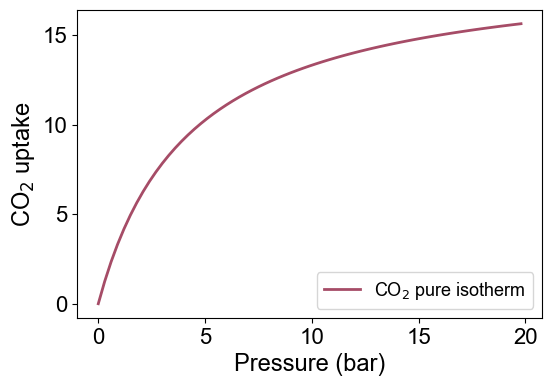

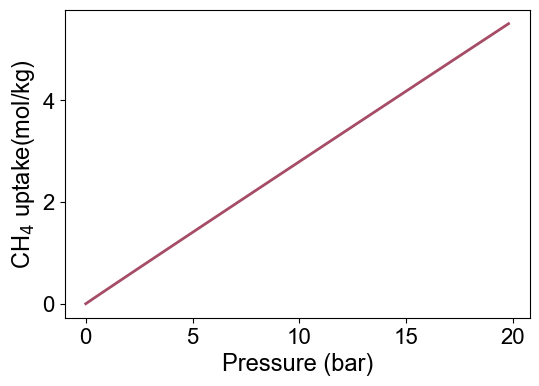

C:\Users\Seunggwan Yun\AppData\Local\Temp\ipykernel_15280\1413149000.py:60: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[i+5], alpha=0.8, s=40,label=f'P$_1$,$_h$$_i$$_g$$_h$={P_high1}')
C:\Users\Seunggwan Yun\AppData\Local\Temp\ipykernel_15280\1413149000.py:60: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_con

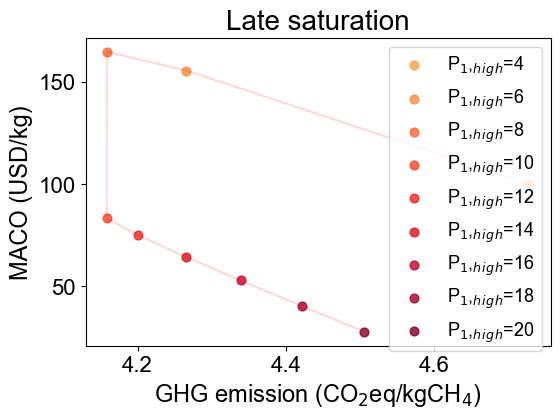

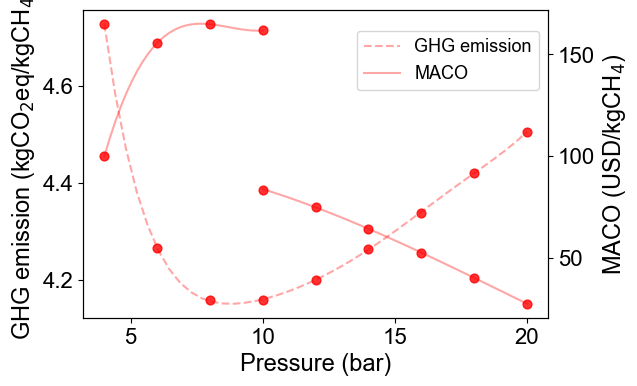

In [ ]:
p = np.arange(0,20,0.3)
i=5
plot_data = late_sat_CO2.iloc[i:i+1,:]

iso = len(plot_data)-1
cmap_case = plt.get_cmap('YlOrRd_r')
num_colors = iso+30
colors = cmap_case(np.linspace(0, 1, num_colors))[:len(plot_data)]

plt.figure(dpi=100, figsize=(6,4))
for i in range(len(plot_data)):
    target = plot_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[0]
    plt.plot(p, mix_iso(p,298), linewidth = 2,c=colors[i], alpha=0.7,label='CO$_2$ pure isotherm')
    mof_name=plot_data.iloc[i,:]['Directory']
    # plt.text(p[-1], mix_iso(p[-1], 298), f'{mof_name}', color=colors[i], fontsize=8, ha='left', va='center')
# plt.title('Late saturation')
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CO$_2$ uptake')
plt.legend(loc='lower right')
plt.show()

plt.figure(dpi=100, figsize=(6,4))
for i in range(len(plot_data)):
    target = plot_data.iloc[i,:]
    mix_iso =WhichIsoFunction(target)[1]
    plt.plot(p, mix_iso(p,298), linewidth = 2,c=colors[i], alpha=0.7)
    mof_name=plot_data.iloc[i,:]['Directory']
    # plt.text(p[-1], mix_iso(p[-1], 298), f'{mof_name}', color=colors[i], fontsize=8, ha='left', va='center')
# plt.title('Late saturation')
plt.ylim()
plt.xlabel('Pressure (bar)')
plt.ylabel('CH$_4$ uptake(mol/kg)')
plt.show()

P_high1=6
P_high2=6
P_low =1
PSA_config = 'PSA'

plt.figure(dpi=100, figsize=(6,4))
i=0
GHG_list=pd.DataFrame()
MACO_list=pd.DataFrame()
for P_high1 in (4,6,8,10,12,14,16,18,20):
    i=i+1
    cmap_case = plt.get_cmap('YlOrRd')
    num_colors = 15
    colors = cmap_case(np.linspace(0, 1, num_colors))   
    plt.title('Late saturation')
    plt.ylabel('MACO (USD/kg)')
    plt.xlabel(f'GHG emission (CO$_2$eq/kgCH$_4$)')
    Elec=PEnergy(PSA_config,P_high1, P_low, P_high2) #kWh/yr 
    reco=plot_data[f'Re_CH4_{PSA_config}_{P_high1}']
    GHG=(529+(1-reco)*390*28)/390*reco+(Elec*370/1000)/(1706697*reco)
    MACO=plot_data[f'Max_adsC_{PSA_config}_{P_high1}']
    GHG_list[f'GHG_{P_high1}']=GHG
    MACO_list[f'MACO_{P_high1}']=MACO
    plt.scatter(GHG, plot_data[f'Max_adsC_{PSA_config}_{P_high1}'], c=colors[i+5], alpha=0.8, s=40,label=f'P$_1$,$_h$$_i$$_g$$_h$={P_high1}')
    plt.legend()

plt.plot([(529+(1-plot_data[f'Re_CH4_{PSA_config}_{P_high1}'])*390*28)/390*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']+(PEnergy(PSA_config,P_high1, P_low, P_high2)*370/1000)/(1706697*plot_data[f'Re_CH4_{PSA_config}_{P_high1}']) for P_high1 in (4,6,8,10,12,14,16,18,20)], [plot_data[f'Max_adsC_{PSA_config}_{P_high1}'] for P_high1 in (4,6,8,10,12,14,16,18,20)], c='r', alpha=0.15)
plt.show()



fig, ax1 = plt.subplots(dpi=100, figsize=(6, 4))
ax2 = ax1.twinx()
pressures = list(range(4, 22, 2))

# GHG emission
ax1.scatter(pressures,([GHG_list.iloc[0,i] for i in range(9)]) ,c='r',alpha=0.8, s=40)
coeff_late_G=np.polyfit(pressures,([GHG_list.iloc[0,i] for i in range(9)]),6)
poly_late_G = np.poly1d(coeff_late_G)
pressure1=np.linspace(4,20,40)
GHG_late=poly_late_G(pressure1)
ax1.plot(pressure1,GHG_late ,linestyle='--',c='r',alpha=0.35,label='GHG emission')
ax1.set_ylabel('GHG emission (kgCO$_2$eq/kgCH$_4$)')

# MACO
dummy=[]
dummy=[MACO_list.iloc[0,i] for i in range(9)][:3]
dummy.append(-(dummy[2]-dummy[1])/3+dummy[2])
coeff_late=np.polyfit(pressures[:4],dummy,3)
poly_late = np.poly1d(coeff_late)
pressure1=np.linspace(4,10,30)
MACO_late=poly_late(pressure1)

ax2.plot(pressure1,MACO_late,c='r',alpha=0.35)
ax2.scatter(pressures[3],dummy[3],c='r',alpha=0.8, s=40)

coeff_late2=np.polyfit(pressures[4:],[MACO_list.iloc[0,i] for i in range(9)][4:],3)
poly_late2 = np.poly1d(coeff_late2)
pressure2=np.linspace(10,20,30)
MACO_late2=poly_late2(pressure2)
ax2.plot(pressure2,MACO_late2,c='r',alpha=0.35, label='MACO')
ax2.scatter(pressures,([MACO_list.iloc[0,i] for i in range(9)]),c='r',alpha=0.8, s=40)

ax2.set_ylabel('MACO (USD/kgCH$_4$)')
ax2.set_xlabel('Pressure (bar)')
ax1.set_xlabel('Pressure (bar)')
fig.legend(bbox_to_anchor=(0.9, 0.85))





### LCOM Stacked bar chart

In [3]:
data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_23148\40912218.py:1: DtypeWarning: Columns (25,26,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  data_clean =pd.read_csv('8. All_data_LCOM=1.75.csv', index_col=0).fillna('NaN')


In [4]:
r = 0.08            # Interest rate (%)
t = 25              # Project lifetime (yr)
porosity = 0.2      # Column porosity (-)
att_ratio = 0.1     # Adsorbent attrition rate (%/yr)

 
Vacuum_pump_cost= 188094

def Compressor_cost(P):
    if P < 3.14:
        CC = 239533
    elif P < 10:
        CC = 2*239533
    elif P <=20:
        CC = 3*239533
    return CC

def PSA_cost(PSA_config,P_high1,P_high2):
    if PSA_config == 'PSA':
        PSA_cost = 486630 + Compressor_cost(P_high1)
    elif PSA_config == 'VSA':
        PSA_cost = 486630 + Compressor_cost(P_high1)+ Vacuum_pump_cost
    elif PSA_config == 'cas':
        PSA_cost = 486630 + Compressor_cost(P_high1) +(486630+Compressor_cost(P_high2))*(0.4**0.6) 
    return PSA_cost

def PEnergy(PSA_config,P_high1,P_low,P_high2):
    R = 8.314                                                 # Gas const. (J/mol/K)
    if PSA_config == 'PSA' or PSA_config == 'VSA':
        # 1단 PSA 고압 일 
        T_rev_1= 298*(P_high1/1)**(2/7)
        W_rev = 10.12*(7/2)*8.314*(T_rev_1-298.15)/0.8
        
        T_rev_2 = 298*(P_low/1)**(2/7)
        W_rev += -10.12*(7/2)*8.314*(T_rev_2-298.15)/0.8
        electricity = W_rev/3600000*3600*7920                
    elif PSA_config == 'cas':
        
        T_rev_1= 298*(P_high1/1)**(2/7)
        W_rev = 10.12*(7/2)*8.314*(T_rev_1-298.15)/0.8
        
        T_rev_2= 298*(P_high2/1)**(2/7)
        W_rev += 10.12*0.4*(7/2)*8.314*(T_rev_2-298.15)/0.8  
        electricity = W_rev/3600000*3600*7920 
    return electricity

def Economic_V2(PSA_config, target, ads_cost, density, P_high1, P_low, P_high2, recovery = None):
    # CAPEX
    equipment = 2891628 + PSA_cost(PSA_config,P_high1,P_high2) # USD
    FCI = equipment/0.428       # Fixed capital investment
    WC = FCI*0.1                # Working capital
    TCI = FCI+WC
    AF = (1-(1/(1+r)**t))/r     # Annualized factor
    EAC = TCI / AF              # Annualized capital cost

    # OPEX
    FC = FCI*0.035                  # Fixed charge
    RM = 27 * 25344                 # Raw material (Grass silage, 12USD/ton)
    Steam = 12 *  1543.44           # Steam (12USD/ton)

    single_column_volume = (0.45/2)**2*3.14*2.25*(816/500)*3  
    if PSA_config == 'cas':
        PSA_vol = single_column_volume*2*1.4       
    else:
        PSA_vol = single_column_volume*2            # column volume (m3)
    
    ads_repl = 2                    # Adsorbent replacement (year)
    Ads_cost = ads_cost*density * PSA_vol / ads_repl # Adsorbent cost (USD/yr)

    Elect = 0.075 * (1160250 + PEnergy(PSA_config,P_high1,P_low,P_high2)) # Electricity
    M = FCI*0.02                        # Maintenance
    OL = 3*30000                        # Operating labor (3 person)
    S = OL * 0.15                       # Supervision and support labor
    OS = M * 0.1                        # Operating supplies
    OVHD = (M + OL + S) * 0.2           # Plant overhead cost

    VPC = RM + Steam + Ads_cost + Elect + M + OL + S + OS   # Variable production cost
    TMC = FC+VPC+OVHD                                       # Total manufacturing cost
    GE = OL * 0.15                                          # General expenses
    TPC = TMC + GE                                          # Total production cost

    TAC = EAC + TPC
    if recovery == None:
        if PSA_config == 'PSA':
            recovery = target[f'Re_CH4_PSA_{P_high1}']
        elif PSA_config == 'VSA':
            recovery = target[f'Re_CH4_VSA_{P_low}']
        elif PSA_config == 'cas':
            recovery = target[f'Re_CH4_cas_{P_high1}_{P_high2}']
            
    CH4_prod = recovery * 1706697      # Annual CH4 production (F_f,CH4 = 1706697 kg/yr)
    LC = TAC/CH4_prod            # Levelized cost ($/kg H4)
    # return  int(EAC),int(TPC), int(LC), int(Elect), int(FC), int(VPC), int(RM), int(Ads_cost), int(CH4_prod) 
    return int(EAC), int(TPC), LC, Elect, FC, VPC, RM, Ads_cost, M, CH4_prod

In [5]:
# PSA Conditions
PSA_config = 'PSA'
P_low = 1
P_high1 = 6
P_high2 = 6

# Adsorbent selection criteria
reco = 0.9603
adsC = 300

# GHG conversion code
plot_data1 = data_clean[data_clean[f'Max_adsC_{PSA_config}_{P_high1}'] < 10**10]  # Remove adsorbents that failed the criteria (no MACO derived)
plot_data2 = plot_data1[
    (plot_data1[f'Re_CH4_{PSA_config}_{P_high1}'] > reco) & 
    (plot_data1[f'Max_adsC_{PSA_config}_{P_high1}'] > adsC)
]  # Filter adsorbents based on conditions

# Optimized data
opt_data_PSA = pd.read_csv('PSA_opt_Diffev.csv', index_col=0).fillna('NaN')
data = opt_data_PSA.copy()
data.rename(columns={'MOF_name': 'Directory'}, inplace=True)

# Combine selected adsorbents with optimization data
combined_PSA = pd.merge(plot_data2, data, how='inner', on='Directory')

# Sort results by optimized MACO values
df = combined_PSA.copy().sort_values('opt_MACO_Diffev', ascending=True)


In [6]:
df=data_clean.sort_values('Re_CH4_PSA_8')

In [7]:
# PSA Results 
PSA_config='PSA'
P_high1=6
P_high2=6
P_low=1


result=pd.DataFrame()


for j in [7,8,15,50]:
    target_mof=df.iloc[j,:]
    name_MOF =target_mof['Adsorbent'].strip('_clean')
    result[f'{name_MOF}']=Economic_V2(PSA_config, target_mof, 0, target_mof['Density'],P_high1, P_low, P_high2, recovery = None)
    # result[f'{name_MOF}']=Economic_V2(PSA_config, target_mof,0, target_mof['Density'],P_high1, P_low, P_high2, recovery = None)
result

for j in [1000,1600,2400,3000]:
    target_mof=df.iloc[j,:]
    name_MOF =target_mof['Adsorbent'].strip('_clean')
    result[f'{name_MOF}']=Economic_V2(PSA_config, target_mof, target_mof[f'Max_adsC_{PSA_config}_{P_high1}'], target_mof['Density'],P_high1, P_low, P_high2, recovery = None)
    # result[f'{name_MOF}']=Economic_V2(PSA_config, target_mof,0, target_mof['Density'],P_high1, P_low, P_high2, recovery = None)
result


,KIRTUC,MIMSIM,ZOZKEG,VAMQIM,FIJDIM03,RIXBEG,PEGCIP,ETEXEI01
0,9.287010e+05,9.287010e+05,9.287010e+05,9.287010e+05,9.287010e+05,9.287010e+05,9.287010e+05,9.287010e+05
1,1.520845e+06,1.520845e+06,1.520845e+06,1.520845e+06,1.610389e+06,1.712870e+06,1.832193e+06,1.948089e+06
2,2.828299e+00,2.664771e+00,2.229136e+00,1.912806e+00,1.750000e+00,1.750000e+00,1.750000e+00,1.750000e+00
3,1.305779e+05,1.305779e+05,1.305779e+05,1.305779e+05,1.305779e+05,1.305779e+05,1.305779e+05,1.305779e+05
4,3.154354e+05,3.154354e+05,3.154354e+05,3.154354e+05,3.154354e+05,3.154354e+05,3.154354e+05,3.154354e+05
5,1.135161e+06,1.135161e+06,1.135161e+06,1.135161e+06,1.224704e+06,1.327186e+06,1.446509e+06,1.562404e+06
6,6.842880e+05,6.842880e+05,6.842880e+05,6.842880e+05,6.842880e+05,6.842880e+05,6.842880e+05,6.842880e+05
7,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.954328e+04,1.920248e+05,3.113478e+05,4.272431e+05
8,1.802488e+05,1.802488e+05,1.802488e+05,1.802488e+05,1.802488e+05,1.802488e+05,1.802488e+05,1.802488e+05
9,8.660850e+05,9.192338e+05,1.098878e+06,1.280605e+06,1.450909e+06,1.509470e+06,1.577655e+06,1.643880e+06


#### LCOM 

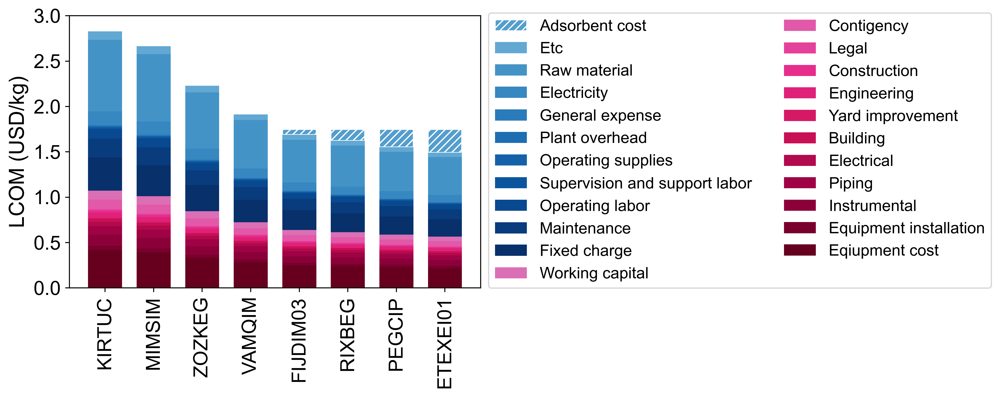

In [8]:
# CAPEX 
Equipment_cost=result.iloc[0,:]*0.428/1.1/result.iloc[-1,:]
Equipment_install=result.iloc[0,:]*0.05/1.1/result.iloc[-1,:]
instrumental=result.iloc[0,:]*0.123/1.1/result.iloc[-1,:]
piping=result.iloc[0,:]*0.097/1.1/result.iloc[-1,:]
Electrical=result.iloc[0,:]*0.05/1.1/result.iloc[-1,:]
building=result.iloc[0,:]*0.036/1.1/result.iloc[-1,:]
Yard_improvement=result.iloc[0,:]*0.006/1.1/result.iloc[-1,:]
Engineering=result.iloc[0,:]*0.059/1.1/result.iloc[-1,:]
Construction=result.iloc[0,:]*0.026/1.1/result.iloc[-1,:]
Legal=result.iloc[0,:]*0.015/1.1/result.iloc[-1,:]
Contigency=result.iloc[0,:]*0.11/1.1/result.iloc[-1,:]
working_capital=result.iloc[0,:]/11/result.iloc[-1,:]

EAC_sum=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement+Engineering+Construction+Legal+Contigency+working_capital

# OPEX 
Fixed_charge=result.iloc[4,:]/result.iloc[-1,:]
maintenance=result.iloc[8,:]/result.iloc[-1,:]
operating_labor=90000/result.iloc[-1,:]
supervision_and_support_labor=13500/result.iloc[-1,:]
operating_supplies=13500/result.iloc[-1,:]
P_OVHD=(maintenance+operating_labor+supervision_and_support_labor)*0.2/result.iloc[-1,:]
General_expense=13500/result.iloc[-1,:]
electricity=result.iloc[3,:]/result.iloc[-1,:]
Raw_material=result.iloc[6,:]/result.iloc[-1,:]
adsorbent_replacement=result.iloc[7,:]/result.iloc[-1,:]
etc=result.iloc[1,:]/result.iloc[-1,:]-(Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity+Raw_material+adsorbent_replacement)

TPC_sum=Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity+Raw_material+adsorbent_replacement+etc

plt.figure(figsize= (6,4), dpi=400)
cmap_case = plt.get_cmap('PuRd_r')

colors = cmap_case(np.linspace(0, 1, 22))
i=0


cmap_case2 = plt.get_cmap('YlGnBu_r')
cmap_case2 = plt.get_cmap('Blues_r')
colors2 = cmap_case2(np.linspace(0, 1, 22))

width = 0.7  # Adjust the width here
plt.bar(list(result.columns.values), adsorbent_replacement,bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity+Raw_material+etc,color=colors2[i+9],hatch='////',edgecolor='White',label='Adsorbent cost',width=width)
# plt.bar(list(result.columns.values), (0,0,0),bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity+Raw_material+etc,color=colors2[i+9],hatch='//////////',edgecolor='White',label='Adsorbent cost',width=width)
plt.bar(list(result.columns.values), etc, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity+Raw_material, color=colors2[i+10], label='Etc', width=width)
plt.bar(list(result.columns.values), Raw_material, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense+electricity, color=colors2[i+8], label='Raw material', width=width)
plt.bar(list(result.columns.values), electricity, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD+General_expense, color=colors2[i+7], label='Electricity', width=width)
plt.bar(list(result.columns.values), General_expense, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies+P_OVHD, color=colors2[i+6], label='General expense', width=width)
plt.bar(list(result.columns.values), P_OVHD, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor+operating_supplies, color=colors2[i+5], label='Plant overhead', width=width)
plt.bar(list(result.columns.values), operating_supplies, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor+supervision_and_support_labor, color=colors2[i+4], label='Operating supplies', width=width)
plt.bar(list(result.columns.values), supervision_and_support_labor, bottom=EAC_sum+Fixed_charge+maintenance+operating_labor, color=colors2[i+3], label='Supervision and support labor', width=width)
plt.bar(list(result.columns.values), operating_labor, bottom=EAC_sum+Fixed_charge+maintenance, color=colors2[i+2], label='Operating labor', width=width)
plt.bar(list(result.columns.values), maintenance, bottom=EAC_sum+Fixed_charge, color=colors2[i+1], label='Maintenance', width=width)
plt.bar(list(result.columns.values), Fixed_charge, bottom=EAC_sum, color=colors2[i], label='Fixed charge', width=width)

plt.bar(list(result.columns.values), working_capital, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement+Engineering+Construction+Legal+Contigency, color=colors[i+11], label='Working capital', width=width)
plt.bar(list(result.columns.values), Contigency, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement+Engineering+Construction+Legal, color=colors[i+10], label='Contigency', width=width)
plt.bar(list(result.columns.values), Legal, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement+Engineering+Construction, color=colors[i+9], label='Legal', width=width)
plt.bar(list(result.columns.values), Construction, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement+Engineering, color=colors[i+8], label='Construction', width=width)
plt.bar(list(result.columns.values), Engineering, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building+Yard_improvement, color=colors[i+7], label='Engineering', width=width)
plt.bar(list(result.columns.values), Yard_improvement, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical+building, color=colors[i+6], label='Yard improvement', width=width)
plt.bar(list(result.columns.values), building, bottom=Equipment_cost+Equipment_install+instrumental+piping+Electrical, color=colors[i+5], label='Building', width=width)
plt.bar(list(result.columns.values), Electrical, bottom=Equipment_cost+Equipment_install+instrumental+piping, color=colors[i+4], label='Electrical', width=width)
plt.bar(list(result.columns.values), piping, bottom=Equipment_cost+Equipment_install+instrumental, color=colors[i+3], label='Piping', width=width)
plt.bar(list(result.columns.values), instrumental, bottom=Equipment_cost+Equipment_install, color=colors[i+2], label='Instrumental', width=width)
plt.bar(list(result.columns.values), Equipment_install, bottom=Equipment_cost, color=colors[i+1], label='Equipment installation', width=width)
plt.bar(list(result.columns.values), Equipment_cost, color=colors[i], label='Eqiupment cost', width=width)

plt.ylim(0,3)
plt.yticks(np.arange(0,3.5,0.5))
plt.xticks(rotation=90)
plt.ylabel('LCOM (USD/kg)')
# plt.xticks([])


plt.legend(loc='lower left', bbox_to_anchor=(1,-0.03),ncol=2)

plt.show()